# Initialize

In [1]:
%cd "/leonardo_scratch/fast/INF24_pmlhep_1/rtorre00/git/github/GenerativeModelsMetrics"

/leonardo_scratch/fast/INF24_pmlhep_1/rtorre00/git/github/GenerativeModelsMetrics


In [2]:
visible_devices = [0]
from datetime import datetime
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing os...")
import os
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing sys...")
import sys
if not any("ipykernel" in arg for arg in sys.argv):
    print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing and initializing argparse...")
    import argparse
    parser = argparse.ArgumentParser()
    parser.add_argument("-v", "--visible_devices", help="Set visible devices", nargs='*', type=list, default=visible_devices)
    args = parser.parse_args()
    visible_devices = args.visible_devices if args.visible_devices else visible_devices
    if not isinstance(visible_devices, list):
        raise ValueError("Visible devices must be a list of integers")
    for i in visible_devices:
        if not isinstance(i, int):
            raise ValueError("Visible devices must be a list of integers")
print("Visible devices:", visible_devices)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing timer from timeit...")
from timeit import default_timer as timer
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Setting env variables for tf import (only device(s)", visible_devices, "will be available)...")
os.environ["CUDA_VISIBLE_DEVICES"] = ','.join([str(i) for i in visible_devices]) # type: ignore
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=2'
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing numpy...")
import numpy as np # type: ignore
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing matplotlib...")
from matplotlib import pyplot as plt
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing h5py...")
import h5py # type: ignore
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing importlib.util...")
import importlib.util
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing json...")
import json
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing pandas...")
import pandas as pd
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing random...")
import random
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing scipy utils...")
from scipy.stats import norm, lognorm, chi2, kstwo, kstwobign, ks_2samp, moment
from scipy.special import kolmogorov
from scipy.optimize import minimize, curve_fit, root, bisect
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing subprocess...")
import subprocess
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tensorflow...")
import tensorflow as tf # type: ignore
print("Tensorflow version:", tf.__version__)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tensorflow_probability...")
import tensorflow_probability as tfp # type: ignore
tfd = tfp.distributions
print("Tensorflow probability version:", tfp.__version__)
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing timeit...")
from timeit import default_timer as timer
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing tqdm...")
from tqdm import tqdm
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing typing...")
from typing import List, Tuple, Dict, Callable, Union, Optional, Any, Type
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Setting tf configs...")
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for gpu_device in gpu_devices:
    tf.config.experimental.set_memory_growth(gpu_device, True)

print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing GMetrics module...")

import GMetrics # type: ignore
from GMetrics.utils import se_mean, se_std # type: ignore
from GMetrics.plotters import cornerplotter, plot_corr_matrix # type: ignore

sys.path.insert(0,'utils_func/')
import MixtureDistributions # type: ignore
from optimizers_deformations import compute_exclusion_bisection, compute_exclusion_LR_bisection # type: ignore

print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "Importing jetnet.evaluation.gen_metrics module...")
from jetnet.evaluation import gen_metrics as JMetrics # type: ignore

def get_gpu_info():
    try:
        gpu_info = subprocess.check_output(["nvidia-smi", "--query-gpu=gpu_name", "--format=csv,noheader"]).decode('utf-8')
        return gpu_info.strip().split('\n')
    except Exception as e:
        print(e)
        return None
training_devices = []
gpu_models = get_gpu_info()
for i in visible_devices:
    if gpu_models:
        training_devices.append(gpu_models[i])
        print(f"Successfully loaded GPU #{i}, model: {gpu_models[i]}")
    else:
        training_devices.append('undetermined')
        print(f"Failed to load GPU {i} model. Defaulting to 'undetermined'.")
print(f"Loaded {len(training_devices)} GPUs: {training_devices}")
    
results_dir = "results/100D_mixture/"
if os.path.exists(results_dir):
    print("Model directory exists")
else:
    os.makedirs(results_dir)
    print("Model directory was created")
    
    
print(datetime.now().strftime("%Y-%m-%d %H:%M:%S.%f")+":", "All done.")

2024-05-03 06:46:31.144990: Importing os...
2024-05-03 06:46:31.145457: Importing sys...
Visible devices: [0]
2024-05-03 06:46:31.145707: Importing timer from timeit...
2024-05-03 06:46:31.145776: Setting env variables for tf import (only device(s) [0] will be available)...
2024-05-03 06:46:31.145907: Importing numpy...


2024-05-03 06:46:31.454448: Importing matplotlib...
2024-05-03 06:46:31.919185: Importing h5py...
2024-05-03 06:46:32.177426: Importing importlib.util...
2024-05-03 06:46:32.177566: Importing json...
2024-05-03 06:46:32.177633: Importing pandas...
2024-05-03 06:46:33.244180: Importing random...
2024-05-03 06:46:33.244334: Importing scipy utils...
2024-05-03 06:46:34.197692: Importing subprocess...
2024-05-03 06:46:34.197824: Importing tensorflow...
Tensorflow version: 2.16.1
2024-05-03 06:46:43.666494: Importing tensorflow_probability...
Tensorflow probability version: 0.24.0
2024-05-03 06:46:45.250142: Importing timeit...
2024-05-03 06:46:45.250238: Importing tqdm...
2024-05-03 06:46:45.261018: Importing typing...
2024-05-03 06:46:45.261130: Setting tf configs...
2024-05-03 06:46:46.556841: Importing GMetrics module...


/leonardo/home/userexternal/rtorre00/fast/rtorre00/envs/tf2_custom/lib/python3.11/site-packages/jetnet/utils/utils.py:7: FutureWarning: In version 2024.7.0 (target date: 2024-06-30 11:59:59-05:00), this will be an error.
To raise these warnings as errors (and get stack traces to find out where they're called), run
    import warnings
    warnings.filterwarnings("error", module="coffea.*")
after the first `import coffea` or use `@pytest.mark.filterwarnings("error:::coffea.*")` in pytest.
Issue: coffea.nanoevents.methods.vector will be removed and replaced with scikit-hep vector. Nanoevents schemas internal to coffea will be migrated. Otherwise please consider using that package!.
  from coffea.nanoevents.methods import vector


2024-05-03 06:46:55.522045: Importing jetnet.evaluation.gen_metrics module...
Successfully loaded GPU #0, model: NVIDIA A100-SXM-64GB
Loaded 1 GPUs: ['NVIDIA A100-SXM-64GB']
Model directory exists
2024-05-03 06:46:55.555580: All done.


# Model definition

In [3]:
seed = 0
ncomp = 10
ndims = 100
niter = 10_000
dist_1 = MixtureDistributions.MixMultiNormal(ncomp = ncomp,
                                             ndims = ndims,
                                             loc_factor = 5.,
                                             scale_factor = 1.,
                                             dtype = tf.float64,
                                             seed = seed)
dist_2 = MixtureDistributions.MixMultiNormal(ncomp = ncomp,
                                             ndims = ndims,
                                             loc_factor = 5.,
                                             scale_factor = 1.,
                                             dtype = tf.float64,
                                             seed = seed)
print(dist_1.dtype, dist_2.dtype)
print('Types of distributions: ', type(dist_1), type(dist_2))
print('Dtypes of distributions: ', dist_1.dtype, dist_2.dtype)
print('Batch shapes of distributions: ', dist_1.batch_shape, dist_2.batch_shape)
print('Event shapes of distributions: ', dist_1.event_shape, dist_2.event_shape)

<dtype: 'float64'> <dtype: 'float64'>
Types of distributions:  <class 'tensorflow_probability.python.distributions.mixture.Mixture'> <class 'tensorflow_probability.python.distributions.mixture.Mixture'>
Dtypes of distributions:  <dtype: 'float64'> <dtype: 'float64'>
Batch shapes of distributions:  () ()
Event shapes of distributions:  (100,) (100,)


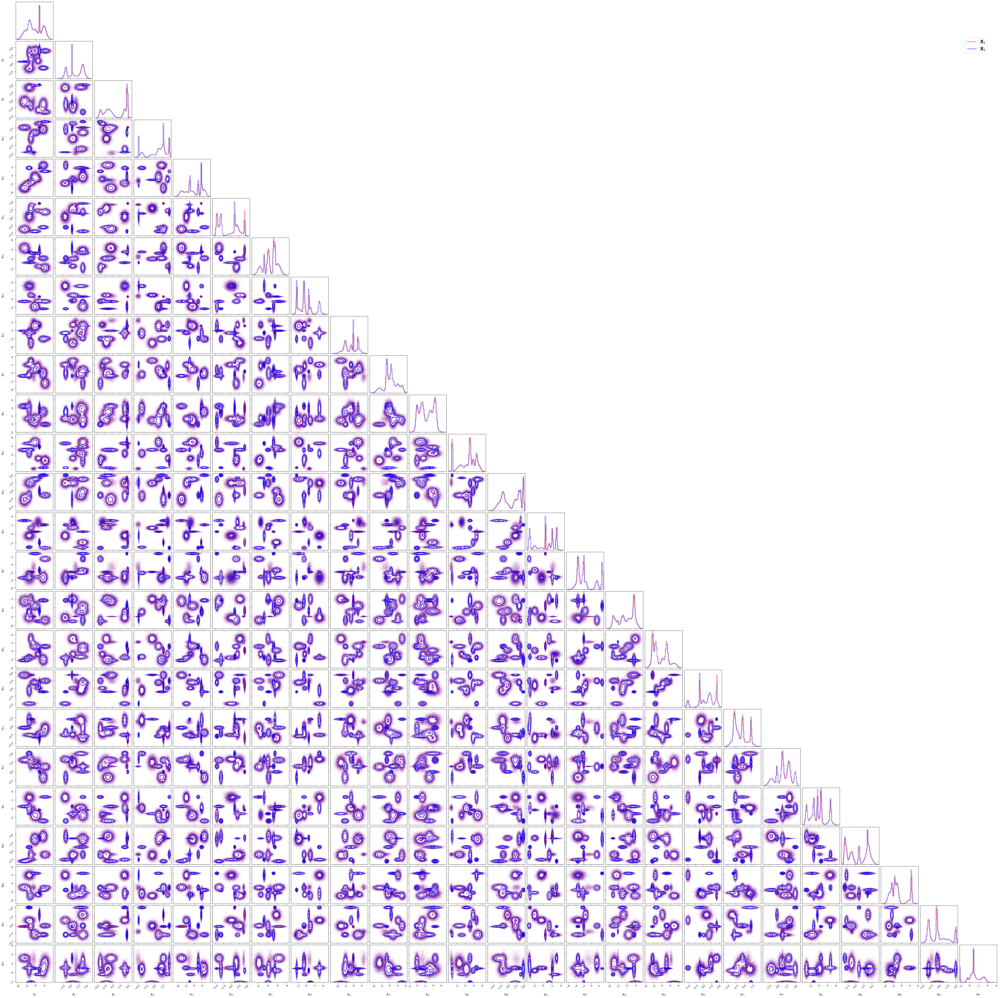

In [4]:
cornerplotter(dist_1 = dist_1, 
              dist_2 = dist_2, 
              path_to_plots = results_dir, 
              figure_name = "corner_plot.png",
              max_points = 50_000,
              max_dim = 32,
              n_bins = 50,
              show = True,
              save = True)

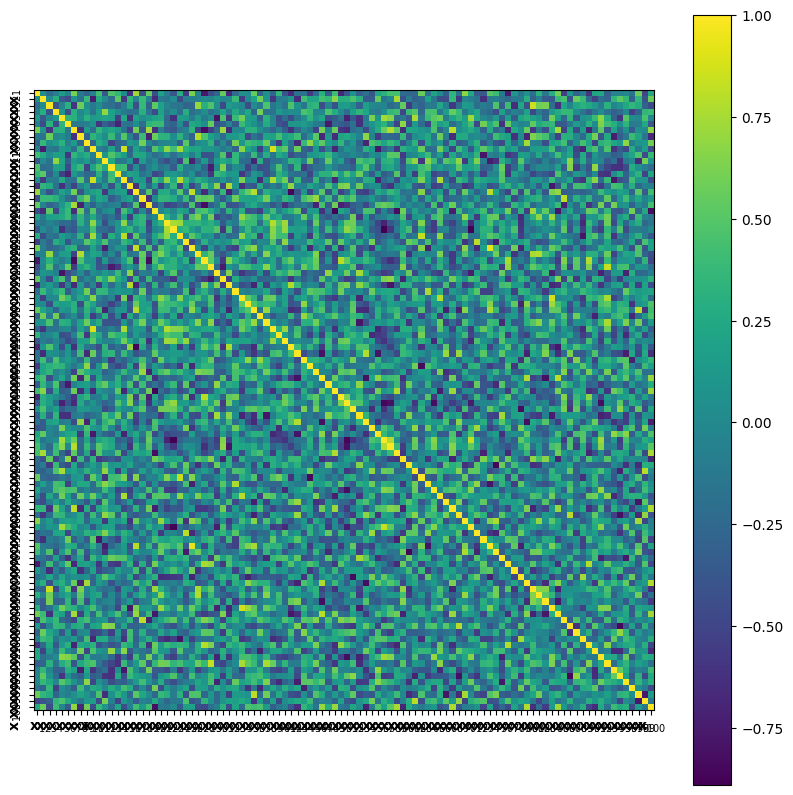

In [5]:
plot_corr_matrix(dist = dist_1,
                 path_to_plots = results_dir,
                 figure_name = "corre_matrix_plot.pdf",
                 max_points = 1_000_000,
                 show_labels = True,
                 show = True,
                 save = True)

# Fixed $n=10000$

## Null hypotheses

### Model definition

In [4]:
batch_size_test = 10_000

In [5]:
model_dir = results_dir + str(ndims) + "D_" + str(int(batch_size_test/1000)) + "K/"
if os.path.exists(model_dir):
    print("Model directory exists")
else:
    os.makedirs(model_dir)
    print("Model directory was created")
null_hypotheses_dir = model_dir + "null_hypothesis/"
if os.path.exists(null_hypotheses_dir):
    print("Null hypothesis directory exists")
else:
    os.makedirs(null_hypotheses_dir)
    print("Null hypothesis directory was created")
metrics_config_file = model_dir + "metrics_config.json"

Model directory exists
Null hypothesis directory exists


In [6]:
TwoSampleTestInputs = GMetrics.TwoSampleTestInputs(dist_1_input = dist_1,
                                                   dist_2_input = dist_2,
                                                   niter = niter,
                                                   batch_size_test = batch_size_test,
                                                   batch_size_gen = 10_000,
                                                   small_sample_threshold = 1e7,
                                                   dtype_input = tf.float64,
                                                   seed_input = 0,
                                                   use_tf = True,
                                                   mirror_strategy = False,
                                                   verbose = True)
print("nsamples",TwoSampleTestInputs.nsamples)
print("batch_size",TwoSampleTestInputs.batch_size_test)
print("niter",TwoSampleTestInputs.niter)
print("niter * batch_size",TwoSampleTestInputs.niter*TwoSampleTestInputs.batch_size_test)
print("small_sample",TwoSampleTestInputs.small_sample)

Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.


Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
nsamples 100000000
batch_size 10000
niter 10000
niter * batch_size 100000000
small_sample False


In [7]:
KSTest = GMetrics.KSTest(TwoSampleTestInputs,
                         progress_bar = True,
                         verbose = True)
SKSTest = GMetrics.SKSTest(TwoSampleTestInputs,
                           nslices = 100, # to be included in metric kwargs
                           seed_slicing = 0, # to be included in metric kwargs
                           progress_bar = True,
                           verbose = True)
SWDMetric = GMetrics.SWDMetric(TwoSampleTestInputs,
                               nslices = 100, # to be included in metric kwargs
                               seed_slicing = 0, # to be included in metric kwargs
                               progress_bar = True,
                               verbose = True)
FGDMetric = GMetrics.FGDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               num_batches = 20, # to be included in metric kwargs
                               num_points = 10, # to be included in metric kwargs
                               normalise = False) # to be included in metric kwargs
MMDMetric = GMetrics.MMDMetric(TwoSampleTestInputs,
                               progress_bar = True,
                               verbose = True,
                               degree = 4, # to be included in metric kwargs
                               block_size = 10_000, # to be included in metric kwargs
                               normalise = False) # to be included in metric kwargs
LRMetric = GMetrics.LRMetric(TwoSampleTestInputs,
                             null_test=True,
                             verbose = True)

Generating random directions based on nslices, ndims, and seed_slicing.
Generating random directions based on nslices, ndims, and seed_slicing.
To run under the alternative hypothesis, set the `null_test` attribute to False.


### Set up tests and metrics configurations

In [8]:
test_config_null = {}
test_config_tmp = dict(TwoSampleTestInputs.__dict__)
keys_to_remove = ["_dist_1_input", "_dist_2_input", "_dist_1_num", "_dist_2_num", "_dist_1_symb", "_dist_2_symb", "_seed_generator"]
for key in keys_to_remove:
    test_config_tmp.pop(key, None)
for key, value in test_config_tmp.items():
    new_key = key.lstrip('_')
    
    if isinstance(value, tf.Tensor):
        new_value = value.numpy() # type: ignore
    elif isinstance(value, np.ndarray):
        new_value = value.tolist()
    elif isinstance(value, np.generic):
        new_value = value.item() # Convert NumPy scalars to Python scalars
    elif isinstance(value, tf.DType):
        new_value = value.name
    elif isinstance(value, np.dtype):
        new_value = np.dtype(value).name
    else:
        new_value = value
    
    test_config_null[new_key] = new_value

test_config_null["ncomp"] = ncomp

pd.DataFrame([test_config_null])

,niter,batch_size_test,batch_size_gen,small_sample_threshold,dtype_input,seed,use_tf,mirror_strategy,strategy,verbose,...,ndims_1,nsamples_1,is_symb_2,ndims_2,nsamples_2,dtype,ndims,nsamples,small_sample,ncomp
0,10000,10000,10000,10000000,float64,0,True,False,None,True,...,100,0,True,100,0,float64,100,100000000,False,10


In [9]:
unique_key = "config_ndims_"+str(TwoSampleTestInputs.ndims)+"_ncop_"+str(ncomp)+"_nsamples_"+str(TwoSampleTestInputs.batch_size_test)+"_niter_"+str(TwoSampleTestInputs.niter)
metrics_config = {unique_key: {"fgd": {"name": "fgd",
                                       "object_name": "FGDMetric",
                                       "class_name": "GMetrics.FGDMetric",
                                       "kwargs": {"num_batches": 20,
                                                  "num_points": 10,
                                                  "normalise": False},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1,
                                       "scale_func_string": "lambda ns, ndims: 1",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100, # optimized for 5D
                                       "latex": "$d_{\mathrm{FGD}}$",
                                       "null_file": null_hypotheses_dir+"FGD.json"},
                               "mmd": {"name": "mmd",
                                       "object_name": "MMDMetric" ,
                                       "class_name": "GMetrics.MMDMetric",
                                       "kwargs": {"degree": 4, 
                                                  "block_size": 10_000, 
                                                  "normalise": False},
                                       "result_key": "metric_list", 
                                       "scale_func": lambda ns, ndims: 1,
                                       "scale_func_string": "lambda ns, ndims: 1",
                                       "test_config": test_config_null,
                                       "max_vectorize": 2, # optimized for 5D
                                       "latex": "$d_{\mathrm{MMD}}$",
                                       "null_file": null_hypotheses_dir+"MMD.json"},
                               "ks":  {"name": "ks",
                                       "object_name": "KSTest",
                                       "class_name": "GMetrics.KSTest", 
                                       "kwargs": {},
                                       "result_key": "statistic_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 10000,
                                       "latex": "$\overline{D}$",
                                       "null_file": null_hypotheses_dir+"KS.json"},
                               "sks": {"name": "sks",
                                       "object_name": "SKSTest",
                                       "class_name": "GMetrics.SKSTest", 
                                       "kwargs": {"nslices": 100, 
                                                  "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, _ : np.sqrt(ns),
                                       "scale_func_string": "lambda ns, _: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{D}$",
                                       "null_file": null_hypotheses_dir+"SKS.json"},
                               "swd": {"name": "swd",
                                       "object_name": "SWDMetric",
                                       "class_name": "GMetrics.SWDMetric", 
                                       "kwargs": {"nslices": 100, 
                                                  "seed_slicing": 0},
                                       "result_key": "metric_means", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns/ndims),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns/ndims)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 200,
                                       "latex": "$\widetilde{W}$",
                                       "null_file": null_hypotheses_dir+"SWD.json"},
                               "lr": {"name": "lr",
                                       "object_name": "LRMetric",
                                       "class_name": "GMetrics.LRMetric", 
                                       "kwargs": {"null_test": True},
                                       "result_key": "lik_ratio_norm_list", 
                                       "scale_func": lambda ns, ndims: np.sqrt(ns),
                                       "scale_func_string": "lambda ns, ndims: np.sqrt(ns)",
                                       "test_config": test_config_null,
                                       "max_vectorize": 100,
                                       "latex": "$t_{\mu}$",
                                       "null_file": null_hypotheses_dir+"LR.json"}}}
metrics_config[unique_key]

{'fgd': {'name': 'fgd',
  'object_name': 'FGDMetric',
  'class_name': 'GMetrics.FGDMetric',
  'kwargs': {'num_batches': 20, 'num_points': 10, 'normalise': False},
  'result_key': 'metric_list',
  'scale_func': <function __main__.<lambda>(ns, ndims)>,
  'scale_func_string': 'lambda ns, ndims: 1',
  'test_config': {'niter': 10000,
   'batch_size_test': 10000,
   'batch_size_gen': 10000,
   'small_sample_threshold': 10000000,
   'dtype_input': 'float64',
   'seed': 0,
   'use_tf': True,
   'mirror_strategy': False,
   'strategy': None,
   'verbose': True,
   'is_symb_1': True,
   'ndims_1': 100,
   'nsamples_1': 0,
   'is_symb_2': True,
   'ndims_2': 100,
   'nsamples_2': 0,
   'dtype': 'float64',
   'ndims': 100,
   'nsamples': 100000000,
   'small_sample': False,
   'ncomp': 10},
  'max_vectorize': 100,
  'latex': '$d_{\\mathrm{FGD}}$',
  'null_file': 'results/100D_mixture/100D_10K/null_hypothesis/FGD.json'},
 'mmd': {'name': 'mmd',
  'object_name': 'MMDMetric',
  'class_name': 'GMetric

### Evaluate null hypotheses

In [10]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    file = metric["null_file"]
    name = metric["name"]
    max_vectorize = metric["max_vectorize"]
    obj = eval(metric["object_name"])
    if os.path.exists(file):
        print(f"Loading {name} from {file}")
        obj.Results.load_from_json(file)
    else:
        print(f"Computing and savng {name} with max_vectorize = {max_vectorize}")
        obj.Test_tf(max_vectorize=max_vectorize)
        print(f"Saving {name} to {file}")
        obj.Results.save_to_json(file)

Loading fgd from results/100D_mixture/100D_10K/null_hypothesis/FGD.json
Loading mmd from results/100D_mixture/100D_10K/null_hypothesis/MMD.json
Loading ks from results/100D_mixture/100D_10K/null_hypothesis/KS.json


Loading sks from results/100D_mixture/100D_10K/null_hypothesis/SKS.json
Loading swd from results/100D_mixture/100D_10K/null_hypothesis/SWD.json


In [11]:
cl_list = [0.68, 0.95, 0.99]
null_times = []

for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    
    nsamples = obj.Inputs.batch_size_test
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)

    metric_thresholds = [[cl, 
                          [int(cl*len(dist_null)), 
                           int((1-cl)*len(dist_null))], 
                          np.sort(dist_null)[int(len(dist_null)*cl)]] for cl in cl_list]
    print(f"ThresholdS for metric {metric['name']}: {metric_thresholds}")
    null_time = obj.Results[-1].__dict__['computing_time']
    null_times.append([name, int(null_time)])
    print(f"Computing time for metric {metric['name']}: {null_time}")
    
    metric.update({"thresholds": metric_thresholds})
    
metrics_config[unique_key]["lr"]["thresholds"] = []

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

ThresholdS for metric fgd: [[0.68, [6800, 3199], 0.07807947222763514], [0.95, [9500, 500], 0.42941211788677436], [0.99, [9900, 100], 0.70093050224738]]
Computing time for metric fgd: 4198.116596033098
ThresholdS for metric mmd: [[0.68, [6800, 3199], 0.24873826141947575], [0.95, [9500, 500], 1.647822970085599], [0.99, [9900, 100], 2.7647934561982765]]
Computing time for metric mmd: 690.1088943770155
ThresholdS for metric ks: [[0.68, [6800, 3199], 0.9128749817531686], [0.95, [9500, 500], 1.0823689808499943], [0.99, [9900, 100], 1.1912631822182878]]
Computing time for metric ks: 717.5046523530036
ThresholdS for metric sks: [[0.68, [6800, 3199], 0.9083498010690993], [0.95, [9500, 500], 1.071974271991616], [0.99, [9900, 100], 1.1733735308993538]]
Computing time for metric sks: 642.4414269539993
ThresholdS for metric swd: [[0.68, [6800, 3199], 0.3488134117243883], [0.95, [9500, 500], 0.44117447413926164], [0.99, [9900, 100], 0.4993056830184791]]
Computing time for metric swd: 299.39362564287

,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds
0,fgd,FGDMetric,GMetrics.FGDMetric,"{'num_batches': 20, 'num_points': 10, 'normali...",metric_list,<function <lambda> at 0x7fc7b808b380>,"lambda ns, ndims: 1","{'niter': 10000, 'batch_size_test': 10000, 'ba...",100,$d_{\mathrm{FGD}}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.07807947222763514], [0..."
1,mmd,MMDMetric,GMetrics.MMDMetric,"{'degree': 4, 'block_size': 10000, 'normalise'...",metric_list,<function <lambda> at 0x7fc7b808a0c0>,"lambda ns, ndims: 1","{'niter': 10000, 'batch_size_test': 10000, 'ba...",2,$d_{\mathrm{MMD}}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.24873826141947575], [0..."
2,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7fc7b808b4c0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10000,$\overline{D}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9128749817531686], [0...."
3,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7fc7b808b560>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{D}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9083498010690993], [0...."
4,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7fc7b808b600>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{W}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.3488134117243883], [0...."
5,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7fc7b808b6a0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",100,$t_{\mu}$,results/100D_mixture/100D_10K/null_hypothesis/...,[]


### Plots of null-distributions

mu = 0.09053801782451486 +/- 0.0002503931451853746
sigma = 0.1582381575933487 +/- 0.002414125582517594
68%CL = 0.07807947222763514, 95%CL = 0.42941211788677436, 99%CL = 0.70093050224738
mu = 0.09053801782451486 +/- 0.0002503931451853746
sigma = 0.1582381575933487 +/- 0.002414125582517594


/tmp/ipykernel_1842220/1313070078.py:86: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_1842220/1313070078.py:88: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_1842220/1313070078.py:129: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


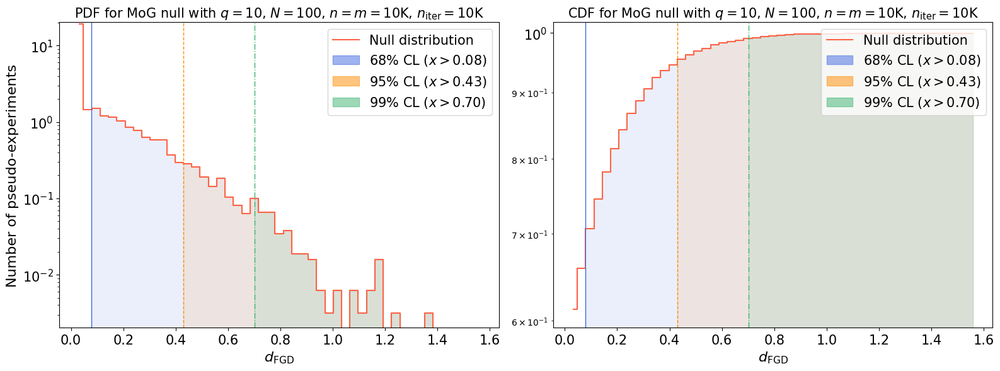

Time elapsed: 1.7054979358799756 seconds.
mu = -0.00703214825774462 +/- 0.007650285525467076
sigma = 0.8746591064790371 +/- 0.009062596281033555
68%CL = 0.24873826141947575, 95%CL = 1.647822970085599, 99%CL = 2.7647934561982765
mu = -0.00703214825774462 +/- 0.007650285525467076
sigma = 0.8746591064790371 +/- 0.009062596281033555


/tmp/ipykernel_1842220/1313070078.py:86: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_1842220/1313070078.py:88: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_1842220/1313070078.py:123: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_1842220/1313070078.py:129: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


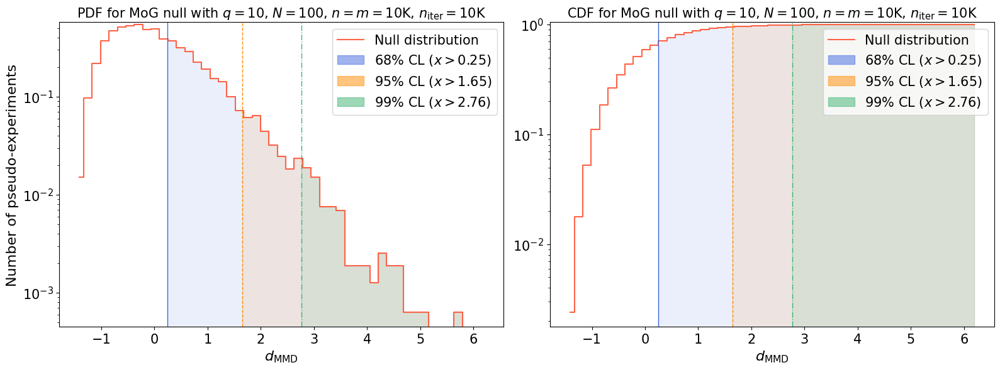

Time elapsed: 0.9510160989593714 seconds.
mu = 0.8647084678836603 +/- 0.00014551178162769082
sigma = 0.12062826436109028 +/- 0.0009472516904521313
68%CL = 0.9128749817531686, 95%CL = 1.0823689808499943, 99%CL = 1.1912631822182878
mu = 0.8647084678836603 +/- 0.00014551178162769082
sigma = 0.12062826436109028 +/- 0.0009472516904521313


/tmp/ipykernel_1842220/1313070078.py:86: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_1842220/1313070078.py:88: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_1842220/1313070078.py:123: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_1842220/1313070078.py:129: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


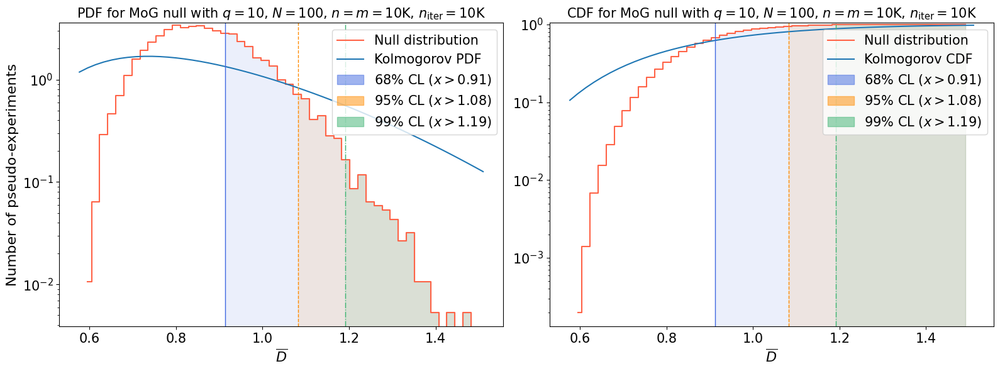

Time elapsed: 1.4105379809625447 seconds.
mu = 0.864007526564679 +/- 0.000129856398023278
sigma = 0.1139545514770156 +/- 0.000855740455832485
68%CL = 0.9083498010690993, 95%CL = 1.071974271991616, 99%CL = 1.1733735308993538
mu = 0.864007526564679 +/- 0.000129856398023278
sigma = 0.1139545514770156 +/- 0.000855740455832485


/tmp/ipykernel_1842220/1313070078.py:86: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_1842220/1313070078.py:88: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_1842220/1313070078.py:123: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_1842220/1313070078.py:129: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


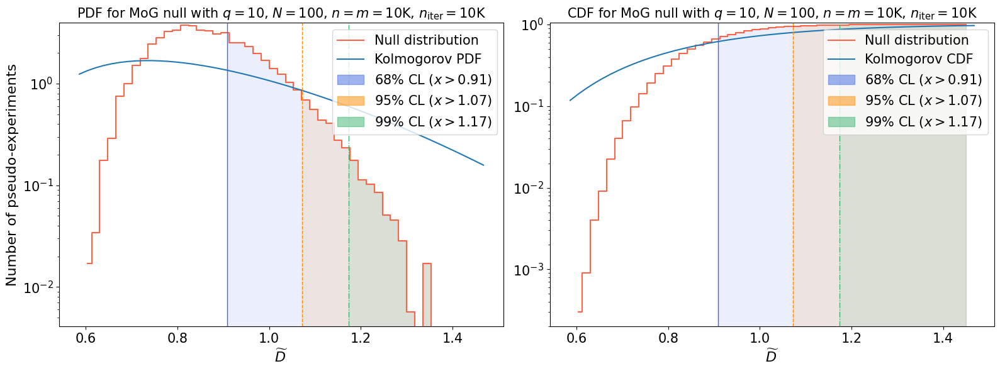

Time elapsed: 1.3191475251223892 seconds.
mu = 0.32250507582486043 +/- 4.2769924291004665e-05
sigma = 0.06539871886436666 +/- 0.0004805882884589075
68%CL = 0.3488134117243883, 95%CL = 0.44117447413926164, 99%CL = 0.4993056830184791
mu = 0.32250507582486043 +/- 4.2769924291004665e-05
sigma = 0.06539871886436666 +/- 0.0004805882884589075


/tmp/ipykernel_1842220/1313070078.py:86: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[0].set_ylim(current_ylim0)
/tmp/ipykernel_1842220/1313070078.py:88: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend0.legendHandles[-3:]:
/tmp/ipykernel_1842220/1313070078.py:123: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  ax[1].set_ylim(current_ylim1)
/tmp/ipykernel_1842220/1313070078.py:129: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles[-3:]:


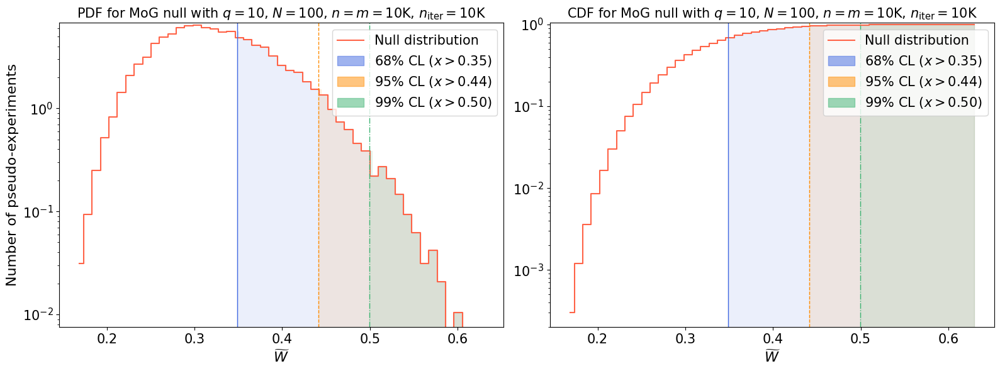

Time elapsed: 0.958689748076722 seconds.


,name,object_name,class_name,kwargs,result_key,scale_func,scale_func_string,test_config,max_vectorize,latex,null_file,thresholds,null_figure
0,fgd,FGDMetric,GMetrics.FGDMetric,"{'num_batches': 20, 'num_points': 10, 'normali...",metric_list,<function <lambda> at 0x7fc7b808b380>,"lambda ns, ndims: 1","{'niter': 10000, 'batch_size_test': 10000, 'ba...",100,$d_{\mathrm{FGD}}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.07807947222763514], [0...",results/100D_mixture/100D_10K/null_hypothesis/...
1,mmd,MMDMetric,GMetrics.MMDMetric,"{'degree': 4, 'block_size': 10000, 'normalise'...",metric_list,<function <lambda> at 0x7fc7b808a0c0>,"lambda ns, ndims: 1","{'niter': 10000, 'batch_size_test': 10000, 'ba...",2,$d_{\mathrm{MMD}}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.24873826141947575], [0...",results/100D_mixture/100D_10K/null_hypothesis/...
2,ks,KSTest,GMetrics.KSTest,{},statistic_means,<function <lambda> at 0x7fc7b808b4c0>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",10000,$\overline{D}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9128749817531686], [0....",results/100D_mixture/100D_10K/null_hypothesis/...
3,sks,SKSTest,GMetrics.SKSTest,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7fc7b808b560>,"lambda ns, _: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{D}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.9083498010690993], [0....",results/100D_mixture/100D_10K/null_hypothesis/...
4,swd,SWDMetric,GMetrics.SWDMetric,"{'nslices': 100, 'seed_slicing': 0}",metric_means,<function <lambda> at 0x7fc7b808b600>,"lambda ns, ndims: np.sqrt(ns/ndims)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",200,$\widetilde{W}$,results/100D_mixture/100D_10K/null_hypothesis/...,"[[0.68, [6800, 3199], 0.3488134117243883], [0....",results/100D_mixture/100D_10K/null_hypothesis/...
5,lr,LRMetric,GMetrics.LRMetric,{'null_test': True},lik_ratio_norm_list,<function <lambda> at 0x7fc7b808b6a0>,"lambda ns, ndims: np.sqrt(ns)","{'niter': 10000, 'batch_size_test': 10000, 'ba...",100,$t_{\mu}$,results/100D_mixture/100D_10K/null_hypothesis/...,[],NaN


In [12]:
for metric in list(metrics_config[unique_key].values())[:-1]:
    name = metric["name"]
    name_cap = name.upper()
    latex = metric["latex"]
    obj = eval(metric["object_name"])
    result_key = metric["result_key"]
    scale_func = metric["scale_func"]
    figure_file = metric["null_file"].replace("json","pdf")
    thresholds = metric["thresholds"]

    start = timer()
    
    nsamples = obj.Inputs.batch_size_test
    niter = obj.Inputs.niter
    ns = nsamples**2 /(2*nsamples)
    dist_null = np.array(obj.Results[-1].result_value[result_key])*scale_func(ns, ndims)
    #if "FGD" in latex:
    #    latex = r"$d_{\mathrm{FGD}}\,(\times 10)$"
    #    dist_null = dist_null * 10
    #elif "MMD" in latex:
    #    latex = r"$d_{\mathrm{MMD}}\,(\times 10^{-2})$"
    #    dist_null = dist_null / 100
    
    scale = 'log'
    num_bins = 50  # number of bins|
    
    mu, deltamu, sigma, deltasigma = (np.mean(dist_null), se_mean(dist_null), np.std(dist_null), se_std(dist_null))
    sigma_68, sigma_95, sigma_99 = [np.sort(dist_null)[int(len(dist_null)*cl)] for cl in [0.68, 0.95, 0.99]]
    print(f"mu = {mu} +/- {deltamu}")
    print(f"sigma = {sigma} +/- {deltasigma}")
    print(f"68%CL = {sigma_68}, 95%CL = {sigma_95}, 99%CL = {sigma_99}")
    
    print("mu =", mu, "+/-", deltamu)
    print("sigma =", sigma, "+/-", deltasigma)
    
    min_x, max_x = min(dist_null), max(dist_null) # lower and upper limit of the binning
    x = np.linspace(min_x, max_x, num_bins + 1)
    counts, bin_edges = np.histogram(dist_null, bins=x, density=True)
    cum_counts = np.cumsum(counts)/np.sum(counts)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Only if metric is KS-derived plot the theoretical distribution
    if "ks" in name:
        # Calculate the theoretical PDF and CDF of the KS distribution for each x value
        theoretical_pdf_ks = kstwobign.pdf(x)
        theoretical_cdf_ks = kstwobign.cdf(x)

        # Empirical SKS Normal
        empirical_pdf_norm = norm.pdf(x, loc=kstwobign.mean(), scale=kstwobign.std())
        empirical_cdf_norm = norm.cdf(x, loc=kstwobign.mean(), scale=kstwobign.std())

    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    
    dash_styles = ['-', '--', '-.']
    colors = ["royalblue", "darkorange", "mediumseagreen"]
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = counts[:-1]  # assuming counts is one element longer than step_edges

    ax[0].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    current_ylim0 = ax[0].get_ylim()
    if "ks" in name:
        ax[0].plot(x, theoretical_pdf_ks, label="Kolmogorov PDF")
    ax[0].set_yscale(scale)
    ax[0].set_xlabel(r"%s"%latex, fontsize=16)
    ax[0].set_ylabel('Number of pseudo-experiments', fontsize=16)
    ax[0].set_title('PDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[0].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[0].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        #if "FGD" in latex:
        #    threshold_value = threshold_value * 10
        #elif "MMD" in latex:
        #    threshold_value = threshold_value / 100
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[0].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[0].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)

    ax[0].set_ylim(current_ylim0)  
    legend0 = ax[0].legend(loc='upper right', fontsize=15)
    for handle in legend0.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    # Create step plot
    step_edges = np.convolve(bin_centers, [0.5, 0.5], 'valid')
    step_counts = cum_counts[:-1]  # assuming counts is one element longer than step_edges
    
    ax[1].step(step_edges, step_counts, where='mid', linestyle='-', color = "tomato", label = "Null distribution")
    #ax[1].plot(bin_centers, cum_counts, linestyle = '-', color = "tomato", label = "Null distribution", drawstyle='steps-mid')
    current_ylim1 = ax[1].get_ylim()
    if "ks" in name:
        ax[1].plot(x, theoretical_cdf_ks, label="Kolmogorov CDF")
    #for i, threshold in enumerate(thresholds):
    #    confidence_level, _, threshold_value = threshold
    #    ax[1].axhline(y=confidence_level, color=colors[i], linestyle=dash_styles[i], linewidth=0.5, alpha=1)
    ax[1].set_yscale(scale)
    ax[1].set_xlabel(r"%s"%latex, fontsize=16)
    ax[1].set_title('CDF for MoG null with $q = '+str(ncomp)+'$, $N = '+str(ndims)+'$, $n=m='+str(int(nsamples/1000))+'$K, $n_{\mathrm{iter}} = '+str(int(niter/1000))+'$K', fontsize=15)
    ax[1].tick_params(axis='x', labelsize=15)  # Set x-axis tick label size
    ax[1].tick_params(axis='y', labelsize=15)  # Set y-axis tick label size
    
    for i, threshold in enumerate(thresholds):
        confidence_level, _, threshold_value = threshold
        #if "FGD" in latex:
        #    threshold_value = threshold_value * 10
        #elif "MMD" in latex:
        #    threshold_value = threshold_value / 100
        start_index = np.searchsorted(step_edges, threshold_value, side="right") - 1
        start_index = max(start_index, 0)
        fill_x_range = np.concatenate([[threshold_value], step_edges[start_index+1:]])
        fill_y_values = step_counts[start_index:]
        if len(fill_x_range) > 1 and len(fill_y_values) > 0:
            ax[1].fill_between(fill_x_range, 0, fill_y_values, color=colors[i], alpha=0.1, step='mid', label=f"{int(confidence_level * 100)}% CL ($x>{format(threshold_value, '.2f')}   $)")
        ax[1].axvline(x=threshold_value, linestyle=dash_styles[i], color=colors[i], linewidth=1)
    
    ax[1].set_ylim(current_ylim1)  
    #for i, threshold in enumerate(thresholds):
    #    confidence, _, value = threshold
    #    ax[1].axvline(x=value, color=colors[i], linestyle=dash_styles[i], alpha=1, label=f"{int(confidence_level * 100)} CL% ($x>{format(threshold_value,'.2f')}$)")
    
    legend1 = ax[1].legend(loc='upper right', fontsize=15)
    for handle in legend1.legendHandles[-3:]:
        handle.set_alpha(0.5)  # Set to desired alpha value
    
    plt.subplots_adjust(wspace=0.1)  # Adjust this value to your liking
    plt.tight_layout()
    plt.savefig(figure_file)
    plt.show()
    plt.close()
    
    metric.update({"null_figure": figure_file})

    end = timer()
    print("Time elapsed:", end-start, "seconds.")

GMetrics.utils.save_update_metrics_config(metrics_config = metrics_config, metrics_config_file = metrics_config_file) # type: ignore

## Alternative hypotheses and results

### Scan and exclusion limits (bisection method)

In [13]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": False}

In [14]:
for metric_config in list(metrics_config[unique_key].values())[:-1]:
    print(metric_config["kwargs"])

{'num_batches': 20, 'num_points': 10, 'normalise': False}
{'degree': 4, 'block_size': 10000, 'normalise': False}
{}
{'nslices': 100, 'seed_slicing': 0}
{'nslices': 100, 'seed_slicing': 0}


In [15]:
file_path = model_dir + "exclusion_limits.json"
if os.path.exists(file_path):
    try:
        with open(file_path, "r") as file:
            existing_data = json.load(file)
    except json.JSONDecodeError:
        existing_data = {}
else:
    existing_data = {}

In [16]:
deformations = ["mean", "cov_diag", "cov_off_diag", "power_abs_up", "power_abs_down", "random_normal", "random_uniform"]
global_results = {}

for metric_config in list(metrics_config[unique_key].values())[:-1]:
    for deformation in deformations:
        result = {k: v for k, v in {k: v for k, v in existing_data.items() if v["null_config"]["name"] == metric_config["name"] and v["deformation"] == deformation}.items() if v["exclusion_list"] != []}
        if result == {}:
            print(f"Computing exclusion limits for {metric_config['name']} with {deformation} deformation.")
            result = compute_exclusion_bisection(dist_1,
                                                 metric_config = metric_config,
                                                 test_kwargs = test_kwargs,
                                                 model_dir = model_dir,
                                                 deformation = deformation,
                                                 seed_dist = 0,
                                                 x_tol = 0.02,
                                                 fn_tol = 0.02,
                                                 eps_min = 0.,
                                                 eps_max = 5.,
                                                 max_iterations = 100,
                                                 save = True,
                                                 verbose = True)
        else:
            print(f"Exclusion limits for {metric_config['name']} with {deformation} deformation already loaded.")
        global_results.update(result)
print(global_results.keys())

Exclusion limits for fgd with mean deformation already loaded.
Exclusion limits for fgd with cov_diag deformation already loaded.
Exclusion limits for fgd with cov_off_diag deformation already loaded.
Exclusion limits for fgd with power_abs_up deformation already loaded.
Exclusion limits for fgd with power_abs_down deformation already loaded.
Exclusion limits for fgd with random_normal deformation already loaded.
Exclusion limits for fgd with random_uniform deformation already loaded.
Exclusion limits for mmd with mean deformation already loaded.
Exclusion limits for mmd with cov_diag deformation already loaded.
Exclusion limits for mmd with cov_off_diag deformation already loaded.
Exclusion limits for mmd with power_abs_up deformation already loaded.
Exclusion limits for mmd with power_abs_down deformation already loaded.
Exclusion limits for mmd with random_normal deformation already loaded.
Exclusion limits for mmd with random_uniform deformation already loaded.
Exclusion limits for

I0000 00:00:1714711631.097789 1842220 service.cc:145] XLA service 0xc1c20df0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714711631.098370 1842220 service.cc:153]   StreamExecutor device (0): NVIDIA A100-SXM-64GB, Compute Capability 8.0
W0000 00:00:1714711631.322840 1842220 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_1/Assert/Assert
W0000 00:00:1714711631.328262 1842220 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_3/Assert/Assert
W0000 00:00:1714711631.334517 1842220 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_5/Assert/Assert
W0000 00:00:1714711631.340635 1842220 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_7/Assert/Assert
W0000 00:00:1714711631.344480 1842220 assert_op.cc:38] Ignoring Assert operator while/M

statistic = 5.580861827363434 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.355478321736778

------------ 2 - 0.95 CL ------------
eps = 1.25 - deformation = random_uniform


I0000 00:00:1714711663.699137 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711671.317292 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.713932697760504 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.8674055854449028

------------ 3 - 0.95 CL ------------
eps = 0.625 - deformation = random_uniform


I0000 00:00:1714711684.228266 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



I0000 00:00:1714711691.295957 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.3231810004745441 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.20976237438191153

------------ 4 - 0.95 CL ------------
eps = 0.3125 - deformation = random_uniform


I0000 00:00:1714711704.310066 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711711.773293 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.9576208433363562 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.6666666666666666
relative_error_metric = 0.1126859517857885

------------ 5 - 0.95 CL ------------
eps = 0.46875 - deformation = random_uniform


I0000 00:00:1714711725.341256 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711732.720060 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0942834879435182 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.4
relative_error_metric = 0.020597009612161824

------------ 6 - 0.95 CL ------------
eps = 0.390625 - deformation = random_uniform


I0000 00:00:1714711745.679656 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711752.881746 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0138570672030782 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.18181818181818182
relative_error_metric = 0.05572569909796828

------------ 7 - 0.95 CL ------------
eps = 0.4296875 - deformation = random_uniform


I0000 00:00:1714711766.343599 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711773.743305 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0539359542500049 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.08695652173913043
relative_error_metric = 0.016969971280020636

------------ 8 - 0.95 CL ------------
eps = 0.44921875 - deformation = random_uniform


I0000 00:00:1714711786.804360 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711793.796924 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0726388816945174 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.044444444444444446
relative_error_metric = 0.0006197944853214695

------------ 9 - 0.95 CL ------------
eps = 0.439453125 - deformation = random_uniform


I0000 00:00:1714711806.839525 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711814.026746 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0541621972157225 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.02197802197802198
relative_error_metric = 0.01675534476160347

------------ 10 - 0.95 CL ------------
eps = 0.4443359375 - deformation = random_uniform


I0000 00:00:1714711828.033483 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711835.421336 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0649456396288066 - next threshold = 1.071974271991616 at 0.95 CL
relative_error_eps = 0.01092896174863388
relative_error_metric = 0.00657828337373644
=======> statistic within required accuracy at 0.95 CL in 211.31750123691745 seconds

New threshold. Resetting eps_min and eps_max.

------------ 1 - 0.99 CL ------------
eps = 0.44677734375 - deformation = random_uniform


I0000 00:00:1714711848.466381 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711855.722172 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0645566505588315 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 1.6718960107575078
relative_error_metric = 0.09724778837346895

------------ 2 - 0.99 CL ------------
eps = 2.723388671875 - deformation = random_uniform


I0000 00:00:1714711868.458042 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711875.824872 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 6.041117688372026 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 1.4362726222564497
relative_error_metric = 1.3494351880198936

------------ 3 - 0.99 CL ------------
eps = 1.5850830078125 - deformation = random_uniform


I0000 00:00:1714711890.145775 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711897.365977 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.512001713560506 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 1.120456593571643
relative_error_metric = 0.9982671869991296

------------ 4 - 0.99 CL ------------
eps = 1.01593017578125 - deformation = random_uniform


I0000 00:00:1714711910.426936 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711917.545653 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.1501281807663504 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.7782182349259337
relative_error_metric = 0.5877864581435448

------------ 5 - 0.99 CL ------------
eps = 0.731353759765625 - deformation = random_uniform


I0000 00:00:1714711930.584175 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711937.611102 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.5268206640191755 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.4830980442947805
relative_error_metric = 0.26179386192665005

------------ 6 - 0.99 CL ------------
eps = 0.5890655517578125 - deformation = random_uniform


I0000 00:00:1714711952.130446 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711959.647542 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.2605454493768409 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.27472932164690284
relative_error_metric = 0.0716309122726797

------------ 7 - 0.99 CL ------------
eps = 0.5179214477539062 - deformation = random_uniform


I0000 00:00:1714711972.454006 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711979.697659 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.1604686136955835 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.1285364761018643
relative_error_metric = 0.011058946067674234

------------ 8 - 0.99 CL ------------
eps = 0.5534934997558594 - deformation = random_uniform


I0000 00:00:1714711992.733274 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714711999.880618 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.2108146706031164 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.06640200808217471
relative_error_metric = 0.03140787265046267

------------ 9 - 0.99 CL ------------
eps = 0.5357074737548828 - deformation = random_uniform


I0000 00:00:1714712012.901595 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712020.251711 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.1795676556616475 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.033761461246730205
relative_error_metric = 0.005265006025371008

------------ 10 - 0.99 CL ------------
eps = 0.5268144607543945 - deformation = random_uniform


I0000 00:00:1714712034.984654 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712042.234251 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.169095309674134 - next threshold = 1.1733735308993538 at 0.99 CL
relative_error_eps = 0.016739443604231085
relative_error_metric = 0.0036527454718862343
=======> statistic within required accuracy at 0.99 CL in 206.99080332485028 seconds

New threshold. Resetting eps_min and eps_max.
Time elapsed: 418.30833898996934 seconds.
Saving results in the file results/100D_mixture/100D_10K/exclusion_limits.json
Computing exclusion limits for swd with mean deformation.

=============== swd - mean ===============

------------ 1 - 0.95 CL ------------
eps = 2.5 - deformation = mean


I0000 00:00:1714712055.641122 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712062.913976 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 7.390383611766872 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.7746683511506045

------------ 2 - 0.95 CL ------------
eps = 1.25 - deformation = mean


I0000 00:00:1714712072.388625 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712079.771075 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.7233493405421294 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.576254579134384

------------ 3 - 0.95 CL ------------
eps = 0.625 - deformation = mean


I0000 00:00:1714712088.666732 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712096.258630 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.9038873369612856 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.247483418900218

------------ 4 - 0.95 CL ------------
eps = 0.3125 - deformation = mean


I0000 00:00:1714712105.105606 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712112.315701 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0145382619363885 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.7877430396642906

------------ 5 - 0.95 CL ------------
eps = 0.15625 - deformation = mean


I0000 00:00:1714712121.310511 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712128.870006 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.6009973050826813 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.30671110872478063

------------ 6 - 0.95 CL ------------
eps = 0.078125 - deformation = mean


I0000 00:00:1714712139.286307 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712147.045568 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.42936553621043766 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.6666666666666666
relative_error_metric = 0.027130144021939407

------------ 7 - 0.95 CL ------------
eps = 0.1171875 - deformation = mean


I0000 00:00:1714712156.123409 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712163.580933 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5094263614888334 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.4
relative_error_metric = 0.14359736451204635

------------ 8 - 0.95 CL ------------
eps = 0.09765625 - deformation = mean


I0000 00:00:1714712172.521745 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712179.983580 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4675138343822233 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.2222222222222222
relative_error_metric = 0.057972266168623034

------------ 9 - 0.95 CL ------------
eps = 0.087890625 - deformation = mean


I0000 00:00:1714712188.737749 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712196.359637 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.44788155633226684 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.11764705882352941
relative_error_metric = 0.015088097854637945

------------ 10 - 0.95 CL ------------
eps = 0.0830078125 - deformation = mean


I0000 00:00:1714712205.477175 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712212.664887 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4384732149752387 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.05714285714285714
relative_error_metric = 0.006141684216193752

------------ 11 - 0.95 CL ------------
eps = 0.08544921875 - deformation = mean


I0000 00:00:1714712221.583163 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712229.100703 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4431410074672982 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.028985507246376812
relative_error_metric = 0.0044475831735160416

------------ 12 - 0.95 CL ------------
eps = 0.084228515625 - deformation = mean


I0000 00:00:1714712237.995946 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712245.456913 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4407978347096158 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.014388489208633094
relative_error_metric = 0.0008540844783152179
=======> statistic within required accuracy at 0.95 CL in 198.80653589195572 seconds

New threshold. Resetting eps_min and eps_max.

------------ 1 - 0.99 CL ------------
eps = 0.0848388671875 - deformation = mean


I0000 00:00:1714712254.475699 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712261.748654 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.44196710691687063 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.933261313167687
relative_error_metric = 0.12183200601293641

------------ 2 - 0.99 CL ------------
eps = 2.54241943359375 - deformation = mean


I0000 00:00:1714712272.847129 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712280.790710 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 7.51505849281981 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.87083284934371
relative_error_metric = 1.7507946122419613

------------ 3 - 0.99 CL ------------
eps = 1.313629150390625 - deformation = mean


I0000 00:00:1714712289.643884 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712297.035581 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.9094690157845156 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.7573376977632298
relative_error_metric = 1.5469891594559884

------------ 4 - 0.99 CL ------------
eps = 0.6992340087890625 - deformation = mean


I0000 00:00:1714712306.150160 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712313.588992 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.118604558355799 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.5671888683467938
relative_error_metric = 1.2370927388918154

------------ 5 - 0.99 CL ------------
eps = 0.39203643798828125 - deformation = mean


I0000 00:00:1714712322.633260 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712330.092499 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.237047717310733 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.2883769298456123
relative_error_metric = 0.8497602321651551

------------ 6 - 0.99 CL ------------
eps = 0.23843765258789062 - deformation = mean


I0000 00:00:1714712339.055045 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712346.776037 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.8127837373783314 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.9502625523629713
relative_error_metric = 0.4778303208405541

------------ 7 - 0.99 CL ------------
eps = 0.1616382598876953 - deformation = mean


I0000 00:00:1714712355.905768 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712363.544346 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.6142398793357203 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.6231766299090733
relative_error_metric = 0.20642926558703784

------------ 8 - 0.99 CL ------------
eps = 0.12323856353759766 - deformation = mean


I0000 00:00:1714712372.798169 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712380.430375 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5230048264535899 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.36909045076425967
relative_error_metric = 0.04636388497531788

------------ 9 - 0.99 CL ------------
eps = 0.10403871536254883 - deformation = mean


I0000 00:00:1714712389.605554 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712397.259032 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4808565755660814 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.16895528024589046
relative_error_metric = 0.03764500681558543

------------ 10 - 0.99 CL ------------
eps = 0.11363863945007324 - deformation = mean


I0000 00:00:1714712406.465255 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712414.099227 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5015842893742282 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.08820324094610654
relative_error_metric = 0.004553160524331896

------------ 11 - 0.99 CL ------------
eps = 0.10883867740631104 - deformation = mean


I0000 00:00:1714712423.280927 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712430.796766 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4911267199330555 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.04315012524949431
relative_error_metric = 0.016515944068570265

------------ 12 - 0.99 CL ------------
eps = 0.11123865842819214 - deformation = mean


I0000 00:00:1714712442.172596 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712450.185559 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4963333181010053 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.02134480487381438
relative_error_metric = 0.005970768349033602

------------ 13 - 0.99 CL ------------
eps = 0.11243864893913269 - deformation = mean


I0000 00:00:1714712459.516063 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712466.965039 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.49895342887102034 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.010615754634093933
relative_error_metric = 0.0007057369039026731
=======> statistic within required accuracy at 0.99 CL in 221.49435775610618 seconds

New threshold. Resetting eps_min and eps_max.
Time elapsed: 420.3009283558931 seconds.
Saving results in the file results/100D_mixture/100D_10K/exclusion_limits.json
Computing exclusion limits for swd with cov_diag deformation.

=============== swd - cov_diag ===============

------------ 1 - 0.95 CL ------------
eps = 2.5 - deformation = cov_diag


I0000 00:00:1714712476.232634 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712483.961695 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 23.444339270112145 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.9261184869016366

------------ 2 - 0.95 CL ------------
eps = 1.25 - deformation = cov_diag


I0000 00:00:1714712493.233823 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712500.918053 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 11.590944229273223 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.8533344010264334

------------ 3 - 0.95 CL ------------
eps = 0.625 - deformation = cov_diag


I0000 00:00:1714712510.347858 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712518.019845 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 5.7573605529987235 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.7153040373522177

------------ 4 - 0.95 CL ------------
eps = 0.3125 - deformation = cov_diag


I0000 00:00:1714712527.178261 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712534.937283 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.8929600378754285 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.4707178459063706

------------ 5 - 0.95 CL ------------
eps = 0.15625 - deformation = cov_diag


I0000 00:00:1714712544.207431 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712551.876597 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.495816357428358 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.0889487612448507

------------ 6 - 0.95 CL ------------
eps = 0.078125 - deformation = cov_diag


I0000 00:00:1714712560.849821 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712568.591155 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.8282176918317427 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.6098087384940138

------------ 7 - 0.95 CL ------------
eps = 0.0390625 - deformation = cov_diag


I0000 00:00:1714712577.828436 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712585.535904 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5282728536873339 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.17968666692462426

------------ 8 - 0.95 CL ------------
eps = 0.01953125 - deformation = cov_diag


I0000 00:00:1714712594.571698 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712602.388752 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4083718707632452 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.6666666666666666
relative_error_metric = 0.07722381144440288

------------ 9 - 0.95 CL ------------
eps = 0.029296875 - deformation = cov_diag


I0000 00:00:1714712611.614978 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712621.488122 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4639011038394214 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.4
relative_error_metric = 0.050220402037397666

------------ 10 - 0.95 CL ------------
eps = 0.0244140625 - deformation = cov_diag


I0000 00:00:1714712630.885447 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712638.803972 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4347487830787358 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.18181818181818182
relative_error_metric = 0.014671812873046272

------------ 11 - 0.95 CL ------------
eps = 0.02685546875 - deformation = cov_diag


I0000 00:00:1714712647.988739 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712655.600981 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4490197486429182 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.09523809523809523
relative_error_metric = 0.017625983864818277

------------ 12 - 0.95 CL ------------
eps = 0.025634765625 - deformation = cov_diag


I0000 00:00:1714712664.808614 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712672.943407 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4418028618091675 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.04878048780487805
relative_error_metric = 0.00142333816355749

------------ 13 - 0.95 CL ------------
eps = 0.0250244140625 - deformation = cov_diag


I0000 00:00:1714712682.307676 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712690.187880 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.438254699642562 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.024096385542168676
relative_error_metric = 0.0066401583748779075

------------ 14 - 0.95 CL ------------
eps = 0.02532958984375 - deformation = cov_diag


I0000 00:00:1714712699.304403 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712707.329874 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4400235832711074 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.011976047904191617
relative_error_metric = 0.002612104868992618
=======> statistic within required accuracy at 0.95 CL in 240.3908045219723 seconds

New threshold. Resetting eps_min and eps_max.

------------ 1 - 0.99 CL ------------
eps = 0.025482177734375 - deformation = cov_diag


I0000 00:00:1714712716.452342 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712724.109205 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.440911925169678 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9797176256262334
relative_error_metric = 0.1242132828406152

------------ 2 - 0.99 CL ------------
eps = 2.5127410888671875 - deformation = cov_diag


I0000 00:00:1714712733.192354 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712741.076519 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 23.56593992416523 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9598424960173133
relative_error_metric = 1.917008005458389

------------ 3 - 0.99 CL ------------
eps = 1.2691116333007812 - deformation = cov_diag


I0000 00:00:1714712750.172880 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712757.819084 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 11.770634912377783 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9212658750036833
relative_error_metric = 1.8372263731396319

------------ 4 - 0.99 CL ------------
eps = 0.6472969055175781 - deformation = cov_diag


I0000 00:00:1714712766.883377 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712774.715043 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 5.963581459558462 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.8484960167833755
relative_error_metric = 1.6909705077601642

------------ 5 - 0.99 CL ------------
eps = 0.33638954162597656 - deformation = cov_diag


I0000 00:00:1714712783.832224 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712791.448137 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.1096086592772636 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.7183291606272235
relative_error_metric = 1.4465862742523776

------------ 6 - 0.99 CL ------------
eps = 0.18093585968017578 - deformation = cov_diag


I0000 00:00:1714712800.679374 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712808.551047 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.7132180608055232 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.5062024994802374
relative_error_metric = 1.0973101474508795

------------ 7 - 0.99 CL ------------
eps = 0.10320901870727539 - deformation = cov_diag


I0000 00:00:1714712817.672856 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712827.930689 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.0374145741080587 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.2079589454767772
relative_error_metric = 0.7003342197047256

------------ 8 - 0.99 CL ------------
eps = 0.0643455982208252 - deformation = cov_diag


I0000 00:00:1714712837.766105 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712845.833400 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.7173685363544401 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.86528738072804
relative_error_metric = 0.3584572597393439

------------ 9 - 0.99 CL ------------
eps = 0.0449138879776001 - deformation = cov_diag


I0000 00:00:1714712854.957575 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712862.670252 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5697066223329437 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.5520680750179925
relative_error_metric = 0.13171212148268255

------------ 10 - 0.99 CL ------------
eps = 0.03519803285598755 - deformation = cov_diag


I0000 00:00:1714712871.918383 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712879.824830 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5019860450238122 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.32023142395473675
relative_error_metric = 0.00535380834629216

------------ 11 - 0.99 CL ------------
eps = 0.030340105295181274 - deformation = cov_diag


I0000 00:00:1714712888.968812 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712896.673874 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4704281976079107 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.1482473472041908
relative_error_metric = 0.05955754663725944

------------ 12 - 0.99 CL ------------
eps = 0.03276906907558441 - deformation = cov_diag


I0000 00:00:1714712905.879071 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712913.686665 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4859801009689286 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.07147469029497752
relative_error_metric = 0.02704917145078963

------------ 13 - 0.99 CL ------------
eps = 0.03398355096578598 - deformation = cov_diag


I0000 00:00:1714712922.725097 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712930.377340 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.49392897371302086 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.03510997647380645
relative_error_metric = 0.010826664714160753

------------ 14 - 0.99 CL ------------
eps = 0.034590791910886765 - deformation = cov_diag


I0000 00:00:1714712939.697821 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712947.492065 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_6', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4979444918869842 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.01740224017610954
relative_error_metric = 0.0027298889802129084
=======> statistic within required accuracy at 0.99 CL in 240.14786795410328 seconds

New threshold. Resetting eps_min and eps_max.
Time elapsed: 480.53870993992314 seconds.
Saving results in the file results/100D_mixture/100D_10K/exclusion_limits.json
Computing exclusion limits for swd with cov_off_diag deformation.

=============== swd - cov_off_diag ===============

------------ 1 - 0.95 CL ------------
eps = 2.5 - deformation = cov_off_diag


I0000 00:00:1714712957.360087 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712964.960385 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 10.408417857894065 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.8373489212726648

------------ 2 - 0.95 CL ------------
eps = 1.25 - deformation = cov_off_diag


I0000 00:00:1714712974.387363 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712982.047355 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 5.674393685936532 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.7114417090340834

------------ 3 - 0.95 CL ------------
eps = 0.625 - deformation = cov_off_diag


I0000 00:00:1714712991.336848 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714712998.946927 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 4.893894522895644 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.6692267902181173

------------ 4 - 0.95 CL ------------
eps = 0.3125 - deformation = cov_off_diag


I0000 00:00:1714713008.518075 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713016.223744 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 4.116928270399395 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.6128437651671104

------------ 5 - 0.95 CL ------------
eps = 0.15625 - deformation = cov_off_diag


I0000 00:00:1714713025.549836 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713033.314771 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.2273179229377402 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.518958278893223

------------ 6 - 0.95 CL ------------
eps = 0.078125 - deformation = cov_off_diag


I0000 00:00:1714713042.898138 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713050.723813 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.3397513678310045 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.3654279197510817

------------ 7 - 0.95 CL ------------
eps = 0.0390625 - deformation = cov_off_diag


I0000 00:00:1714713062.948302 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713071.349782 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.536932835246977 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.1078856601037526

------------ 8 - 0.95 CL ------------
eps = 0.01953125 - deformation = cov_off_diag


I0000 00:00:1714713081.184445 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713088.896043 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.9351231533733011 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.717793403635771

------------ 9 - 0.95 CL ------------
eps = 0.009765625 - deformation = cov_off_diag


I0000 00:00:1714713098.394502 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713106.269792 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5810056643966123 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.27359402709123015

------------ 10 - 0.95 CL ------------
eps = 0.0048828125 - deformation = cov_off_diag


I0000 00:00:1714713115.787969 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713123.536110 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4223904599156798 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.6666666666666666
relative_error_metric = 0.04350342049063971

------------ 11 - 0.95 CL ------------
eps = 0.00732421875 - deformation = cov_off_diag


I0000 00:00:1714713132.874336 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713140.728581 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.49655309529063646 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.4
relative_error_metric = 0.11811238776960108

------------ 12 - 0.95 CL ------------
eps = 0.006103515625 - deformation = cov_off_diag


I0000 00:00:1714713150.138164 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713157.704664 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.45763110653180206 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.2222222222222222
relative_error_metric = 0.036618892330983546

------------ 13 - 0.95 CL ------------
eps = 0.0054931640625 - deformation = cov_off_diag


I0000 00:00:1714713166.983647 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713174.623681 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.43945898356605523 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.10526315789473684
relative_error_metric = 0.003896037694676055

------------ 14 - 0.95 CL ------------
eps = 0.00579833984375 - deformation = cov_off_diag


I0000 00:00:1714713184.064369 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713191.648099 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4484181379036336 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.05405405405405406
relative_error_metric = 0.016285350544306642

------------ 15 - 0.95 CL ------------
eps = 0.005645751953125 - deformation = cov_off_diag


I0000 00:00:1714713200.945208 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713208.753912 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.44390458382557935 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.0273972602739726
relative_error_metric = 0.006169188304139395

------------ 16 - 0.95 CL ------------
eps = 0.0055694580078125 - deformation = cov_off_diag


I0000 00:00:1714713218.236359 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713225.819908 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.44167314766832483 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 0.013793103448275862
relative_error_metric = 0.0011296933168199015
=======> statistic within required accuracy at 0.95 CL in 278.3288441058248 seconds

New threshold. Resetting eps_min and eps_max.

------------ 1 - 0.99 CL ------------
eps = 0.00553131103515625 - deformation = cov_off_diag


I0000 00:00:1714713235.130366 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713242.825023 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4405640694901446 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9955798410266963
relative_error_metric = 0.12499947651586017

------------ 2 - 0.99 CL ------------
eps = 2.502765655517578 - deformation = cov_off_diag


I0000 00:00:1714713252.319949 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713259.945805 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 10.415113762758839 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.99117917677386
relative_error_metric = 1.8170106305703122

------------ 3 - 0.99 CL ------------
eps = 1.2541484832763672 - deformation = cov_off_diag


I0000 00:00:1714713269.252858 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713277.169007 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 5.691053417887972 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9824358188163862
relative_error_metric = 1.6773656100529835

------------ 4 - 0.99 CL ------------
eps = 0.6298398971557617 - deformation = cov_off_diag


I0000 00:00:1714713286.491279 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713294.060743 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 4.901395333639607 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9651774524004293
relative_error_metric = 1.6301919462096457

------------ 5 - 0.99 CL ------------
eps = 0.317685604095459 - deformation = cov_off_diag


I0000 00:00:1714713303.438184 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713311.268760 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 4.137233302815108 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.9315467628552672
relative_error_metric = 1.5692427609956046

------------ 6 - 0.99 CL ------------
eps = 0.16160845756530762 - deformation = cov_off_diag


I0000 00:00:1714713323.799399 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713332.050599 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 3.271147618491844 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.8676242983588551
relative_error_metric = 1.470296388162693

------------ 7 - 0.99 CL ------------
eps = 0.08356988430023193 - deformation = cov_off_diag


I0000 00:00:1714713341.879128 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713349.889965 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 2.4239776082388143 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.751684092931158
relative_error_metric = 1.3167878261928838

------------ 8 - 0.99 CL ------------
eps = 0.04455059766769409 - deformation = cov_off_diag


I0000 00:00:1714713359.260142 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713367.038573 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.6771227104581505 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.5582188316363874
relative_error_metric = 1.0823393326147754

------------ 9 - 0.99 CL ------------
eps = 0.02504095435142517 - deformation = cov_off_diag


I0000 00:00:1714713376.519678 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713384.346742 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.1222676010114039 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 1.2762968703543942
relative_error_metric = 0.7683426017537233

------------ 10 - 0.99 CL ------------
eps = 0.01528613269329071 - deformation = cov_off_diag


I0000 00:00:1714713393.763868 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713401.500328 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.7825643770877623 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.937177665555981
relative_error_metric = 0.4419460331974782

------------ 11 - 0.99 CL ------------
eps = 0.01040872186422348 - deformation = cov_off_diag


I0000 00:00:1714713411.038661 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713418.878085 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.6041083836313328 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.611969982729085
relative_error_metric = 0.18996078404375588

------------ 12 - 0.99 CL ------------
eps = 0.007970016449689865 - deformation = cov_off_diag


I0000 00:00:1714713428.263268 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713435.908309 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.518218130588221 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.3612541681209966
relative_error_metric = 0.037173474108099895

------------ 13 - 0.99 CL ------------
eps = 0.0067506637424230576 - deformation = cov_off_diag


I0000 00:00:1714713445.452615 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713453.362303 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.477894173291191 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.16566526700581607
relative_error_metric = 0.043822171256036095

------------ 14 - 0.99 CL ------------
eps = 0.007360340096056461 - deformation = cov_off_diag


I0000 00:00:1714713462.793746 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713470.452010 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.4977475694552087 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.07953844410782071
relative_error_metric = 0.003125437000290054

------------ 15 - 0.99 CL ------------
eps = 0.007665178272873163 - deformation = cov_off_diag


I0000 00:00:1714713480.012657 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713487.790564 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5079134057312902 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.04057606124884964
relative_error_metric = 0.017092056353887372

------------ 16 - 0.99 CL ------------
eps = 0.007512759184464812 - deformation = cov_off_diag


I0000 00:00:1714713497.088953 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713504.834267 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5028121067186349 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.020495941771594084
relative_error_metric = 0.006998027050444018

------------ 17 - 0.99 CL ------------
eps = 0.007436549640260637 - deformation = cov_off_diag


I0000 00:00:1714713514.377286 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713522.085549 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_2', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



statistic = 0.5002754053983275 - next threshold = 0.4993056830184791 at 0.99 CL
relative_error_eps = 0.010300751788009715
relative_error_metric = 0.001940257556061375
=======> statistic within required accuracy at 0.99 CL in 296.2279702760279 seconds

New threshold. Resetting eps_min and eps_max.
Time elapsed: 574.5568481308874 seconds.
Saving results in the file results/100D_mixture/100D_10K/exclusion_limits.json
Computing exclusion limits for swd with power_abs_up deformation.

=============== swd - power_abs_up ===============

------------ 1 - 0.95 CL ------------
eps = 2.5 - deformation = power_abs_up


I0000 00:00:1714713531.210009 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713538.369261 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 660.15080506881 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.9973286113800863

------------ 2 - 0.95 CL ------------
eps = 1.25 - deformation = power_abs_up


I0000 00:00:1714713547.698210 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713554.815701 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 82.79499309629205 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.9787989049944688

------------ 3 - 0.95 CL ------------
eps = 0.625 - deformation = power_abs_up


I0000 00:00:1714713563.926161 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713571.165674 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 23.22713332995228 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.9254404703891848

------------ 4 - 0.95 CL ------------
eps = 0.3125 - deformation = power_abs_up


I0000 00:00:1714713580.583865 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713587.830879 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 8.980359587863006 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.812695269693478

------------ 5 - 0.95 CL ------------
eps = 0.15625 - deformation = power_abs_up


I0000 00:00:1714713596.978198 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713604.196587 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 4.0041369497883 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.6030204122351714

------------ 6 - 0.95 CL ------------
eps = 0.078125 - deformation = power_abs_up


I0000 00:00:1714713613.566948 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714713620.677990 1842220 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



statistic = 1.9344684353142763 - next threshold = 0.44117447413926164 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 1.2571703897354782

------------ 7 - 0.95 CL ------------
eps = 0.0390625 - deformation = power_abs_up


### Likelihood-ratio test

In [ ]:
if test_config_null["use_tf"]:
    dtype = getattr(tf, test_config_null["dtype_input"])
else:
    dtype = np.dtype(test_config_null["dtype_input"])
test_kwargs = {"niter": 10_000,
               "batch_size_test": test_config_null["batch_size_test"],
               "batch_size_gen": test_config_null["batch_size_gen"],
               "small_sample_threshold": test_config_null["small_sample_threshold"],
               "dtype_input": dtype,
               "seed_input": test_config_null["seed"],
               "use_tf": test_config_null["use_tf"],
               "mirror_strategy": test_config_null["mirror_strategy"],
               "verbose": True}
metrics_config[unique_key]["lr"]['kwargs']["verbose"] = True

In [ ]:
deformations = ["mean", "cov_diag", "cov_off_diag", "power_abs_up", "power_abs_down"]#, "random_normal", "random_uniform"]

for deformation in deformations:
    result = {k: v for k, v in existing_data.items() if v["null_config"]["name"] == "lr" and v["deformation"] == deformation}
    if result == {}:
        print(f"Computing exclusion limits for lr with {deformation} deformation.")
        result = compute_exclusion_LR_bisection(dist_1,
                                                metric_config = metrics_config[unique_key]["lr"],
                                                test_kwargs = test_kwargs,
                                                model_dir = model_dir,
                                                cl_list = [0.95, 0.99],
                                                deformation = deformation,
                                                seed_dist = 0,
                                                x_tol = 0.05,
                                                fn_tol = 0.05,
                                                eps_min = 0.,
                                                eps_max = 0.001,
                                                max_iterations = 100,
                                                save = True,
                                                verbose = True)
    else:
        print(f"Exclusion limits for LR with {deformation} deformation already loaded.")
    global_results.update(result)
print(global_results.keys())

Exclusion limits for LR with mean deformation already loaded.
Exclusion limits for LR with cov_diag deformation already loaded.
Exclusion limits for LR with cov_off_diag deformation already loaded.
Computing exclusion limits for lr with power_abs_up deformation.

=============== lr - power_abs_up ===============

------------ 1 - 0.95 CL ------------
eps = 0.0005 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714513692.362944  733771 service.cc:145] XLA service 0xc0fec410 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1714513692.362987  733771 service.cc:153]   StreamExecutor device (0): NVIDIA A100-SXM-64GB, Compute Capability 8.0
W0000 00:00:1714513692.584568  733771 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_1/Assert/Assert
W0000 00:00:1714513692.589574  733771 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_3/Assert/Assert
W0000 00:00:1714513692.594950  733771 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_5/Assert/Assert
W0000 00:00:1714513692.600424  733771 assert_op.cc:38] Ignoring Assert operator while/Mixture_CONSTRUCTED_AT_top_level/sample/assert_equal_7/Assert/Assert
W0000 00:00:1714513692.603809  733771 assert_op.cc:38] Ignoring Assert operator while/M

Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714513749.998774  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714513757.021166  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714513764.152577  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



I0000 00:00:1714513771.013452  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads



LR metric calculation completed in 17.288074255018728 seconds.
statistic = 15047.11164593405 - next threshold = -14471.313167095494 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 102.53040220797796

------------ 2 - 0.95 CL ------------
eps = 0.00025 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714513781.949003  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714513830.971807  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714513837.953743  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714513845.100255  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714513852.003072  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.34011728700716 seconds.
statistic = 3760.7081335942717 - next threshold = -3557.9490323001974 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 72.19066487456718

------------ 3 - 0.95 CL ------------
eps = 0.000125 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714513863.098257  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714513911.791689  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714513918.808123  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714513925.855631  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714513932.836802  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.748689240019303 seconds.
statistic = 941.0255215740953 - next threshold = -851.7250229318037 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 40.150963807874525

------------ 4 - 0.95 CL ------------
eps = 6.25e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714513944.315147  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714513992.929548  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514000.169879  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514007.481211  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514014.532252  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.82626097399043 seconds.
statistic = 234.84470669538072 - next threshold = -191.58761623041835 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 19.716181478789157

------------ 5 - 0.95 CL ------------
eps = 3.125e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514025.769501  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514074.327699  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514081.195403  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514088.421810  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514095.418324  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 18.13312668702565 seconds.
statistic = 58.737079912616665 - next threshold = -37.21018720046019 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 8.914177108235819

------------ 6 - 0.95 CL ------------
eps = 1.5625e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514107.144359  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514155.779472  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514162.591119  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514169.931603  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514177.013670  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.720323153975187 seconds.
statistic = 14.698169950993432 - next threshold = -3.9986805076573977 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 3.4949051648993947

------------ 7 - 0.95 CL ------------
eps = 7.8125e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514187.931063  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514236.812649  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514243.694134  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514250.978056  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514258.035324  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.61641337099718 seconds.
statistic = 3.7379243065944587 - next threshold = 1.6627913042950848 at 0.95 CL
relative_error_eps = 2.0
relative_error_metric = 0.7684659411116751

------------ 8 - 0.95 CL ------------
eps = 3.90625e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514269.767799  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514318.411373  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514325.453696  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514332.810470  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514339.923419  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.785018285008846 seconds.
statistic = 0.9380571725037473 - next threshold = 1.7635871461141475 at 0.95 CL
relative_error_eps = 0.6666666666666666
relative_error_metric = 0.6111315008577622

------------ 9 - 0.95 CL ------------
eps = 5.859375e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514351.051386  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514399.790173  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514407.090114  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514414.450919  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514421.624717  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.960679663985502 seconds.
statistic = 2.0630540974719667 - next threshold = 1.9431751633055512 at 0.95 CL
relative_error_eps = 0.4
relative_error_metric = 0.059846267581376365

------------ 10 - 0.95 CL ------------
eps = 4.8828125e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514433.031095  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514481.849172  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514488.739723  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514495.936251  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514504.313103  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 19.039970257988898 seconds.
statistic = 1.4458465861578318 - next threshold = 1.9085955679117312 at 0.95 CL
relative_error_eps = 0.18181818181818182
relative_error_metric = 0.2759021980405885

------------ 11 - 0.95 CL ------------
eps = 5.37109375e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514515.549247  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514564.359657  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514571.250312  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514578.543116  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514585.563667  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.57426638598554 seconds.
statistic = 1.7407730525700251 - next threshold = 1.9390384888136967 at 0.95 CL
relative_error_eps = 0.08695652173913052
relative_error_metric = 0.10775847296197004

------------ 12 - 0.95 CL ------------
eps = 5.615234375e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514596.682624  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514645.701025  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514652.747289  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514660.119414  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514667.103038  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.75841403499362 seconds.
statistic = 1.8984942494232286 - next threshold = 1.9439252333170698 at 0.95 CL
relative_error_eps = 0.04255319148936174
relative_error_metric = 0.023647071381931017
=======> statistic within required accuracy at 0.95 CL in 980.3604458399932 seconds

New threshold. Resetting eps_min and eps_max.

------------ 1 - 0.99 CL ------------
eps = 5.7373046875e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 

I0000 00:00:1714514678.270216  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514727.008974  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514733.927102  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514741.336452  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514748.571096  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 19.235910772025818 seconds.
statistic = 1.9799193415830585 - next threshold = 3.580749827201464 at 0.99 CL
relative_error_eps = 1.9771816968078648
relative_error_metric = 0.575769008019703

------------ 2 - 0.99 CL ------------
eps = 0.0005028686523437499 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514761.319909  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514810.227149  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514817.209318  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514824.786841  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514831.816486  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.933287595020374 seconds.
statistic = 15219.872243018404 - next threshold = -14407.130168585438 at 0.99 CL
relative_error_eps = 1.9548781951278054
relative_error_metric = 72.90628440092509

------------ 3 - 0.99 CL ------------
eps = 0.00025430297851562495 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514842.887005  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514891.626465  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514898.668475  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514905.976121  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514912.875057  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.573415855003987 seconds.
statistic = 3890.954602934076 - next threshold = -3599.4048177193936 at 0.99 CL
relative_error_eps = 1.9117474474826894
relative_error_metric = 51.383055659862364

------------ 4 - 0.99 CL ------------
eps = 0.00013002014160156249 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714514924.144687  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714514973.045768  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714514980.011303  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514987.302832  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714514994.485799  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.82672578599886 seconds.
statistic = 1017.8853915103499 - next threshold = -888.0865910994319 at 0.99 CL
relative_error_eps = 1.8309542542430035
relative_error_metric = 29.368098573728584

------------ 5 - 0.99 CL ------------
eps = 6.787872314453124e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515005.770289  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515054.794274  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515063.621295  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515071.202464  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515078.453670  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 18.254050110001117 seconds.
statistic = 276.90405421083466 - next threshold = -211.64298105270942 at 0.99 CL
relative_error_eps = 1.6882578505544612
relative_error_metric = 14.97208095489978

------------ 6 - 0.99 CL ------------
eps = 3.680801391601562e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515089.927509  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515138.682445  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515145.623149  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515152.909649  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515160.020385  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.76786967899534 seconds.
statistic = 81.68947907908034 - next threshold = -45.918905531658545 at 0.99 CL
relative_error_eps = 1.4605935622702413
relative_error_metric = 7.134824631288944

------------ 7 - 0.99 CL ------------
eps = 2.127265930175781e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515171.340156  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515220.353285  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515227.502247  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515235.001313  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515242.117368  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.945851100987056 seconds.
statistic = 27.123276419760096 - next threshold = -6.523994496759633 at 0.99 CL
relative_error_eps = 1.1503424899371515
relative_error_metric = 3.2668392075308534

------------ 8 - 0.99 CL ------------
eps = 1.3504981994628904e-05 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515253.227095  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515302.237044  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515309.356976  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515316.726742  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515323.681190  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.618407960020704 seconds.
statistic = 10.939817522259878 - next threshold = 2.1939400798757016 at 0.99 CL
relative_error_eps = 0.8073549090548643
relative_error_metric = 1.3318164850190437

------------ 9 - 0.99 CL ------------
eps = 9.621143341064453e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515334.833390  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515383.779845  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515390.862734  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515398.286773  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515405.776251  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 20.05760674501653 seconds.
statistic = 5.626073753637758 - next threshold = 3.751006506120048 at 0.99 CL
relative_error_eps = 0.5057592598342078
relative_error_metric = 0.3999256048953004

------------ 10 - 0.99 CL ------------
eps = 7.679224014282227e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515419.214470  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515468.207034  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515475.175643  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515482.736499  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515489.765673  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.91053086100146 seconds.
statistic = 3.5152356499066078 - next threshold = 3.9000160665411174 at 0.99 CL
relative_error_eps = 0.22449457712608342
relative_error_metric = 0.10378081051005471

------------ 11 - 0.99 CL ------------
eps = 8.65018367767334e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515501.130679  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515549.900045  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515556.952614  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515564.398159  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515571.327500  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.63731641601771 seconds.
statistic = 4.571189534002211 - next threshold = 3.8805227375145113 at 0.99 CL
relative_error_eps = 0.11892160226600765
relative_error_metric = 0.16343831268731876

------------ 12 - 0.99 CL ------------
eps = 8.164703845977783e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515582.485581  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515631.541087  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515638.577273  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515645.900475  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515652.876841  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 17.600075875001494 seconds.
statistic = 3.9674516789987435 - next threshold = 3.9068223290030972 at 0.99 CL
relative_error_eps = 0.061282762201063
relative_error_metric = 0.015399349815369574

------------ 13 - 0.99 CL ------------
eps = 7.921963930130005e-06 - deformation = power_abs_up
Computing null distribution
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Parsing input distribution...
Input distribution is a tfp.distributions.Distribution object.
Checking and setting numerical distributions.
Resetting dist_num.
Resetting dist_num.
To run under the alternative hypothesis, set the `null_test` attribute to False.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10000
batch_size = 10000
nchunks = 100
Iterating from 0 to 100 out of 10000 .


I0000 00:00:1714515664.172884  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Iterating from 100 to 200 out of 10000 .
Iterating from 200 to 300 out of 10000 .
Iterating from 300 to 400 out of 10000 .
Iterating from 400 to 500 out of 10000 .
Iterating from 500 to 600 out of 10000 .
Iterating from 600 to 700 out of 10000 .
Iterating from 700 to 800 out of 10000 .
Iterating from 800 to 900 out of 10000 .
Iterating from 900 to 1000 out of 10000 .
Iterating from 1000 to 1100 out of 10000 .
Iterating from 1100 to 1200 out of 10000 .
Iterating from 1200 to 1300 out of 10000 .
Iterating from 1300 to 1400 out of 10000 .
Iterating from 1400 to 1500 out of 10000 .
Iterating from 1500 to 1600 out of 10000 .
Iterating from 1600 to 1700 out of 10000 .
Iterating from 1700 to 1800 out of 10000 .
Iterating from 1800 to 1900 out of 10000 .
Iterating from 1900 to 2000 out of 10000 .
Iterating from 2000 to 2100 out of 10000 .
Iterating from 2100 to 2200 out of 10000 .
Iterating from 2200 to 2300 out of 10000 .
Iterating from 2300 to 2400 out of 10000 .
Iterating from 2400 to 2500 

I0000 00:00:1714515713.295187  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads



Setting dist_num from dist_symb.
To run under the null hypothesis, set the `null_test` attribute to True.

------------------------------------------
Starting LR metric calculation...
Running TF LR calculation...
niter = 10
batch_size = 10000


I0000 00:00:1714515720.213955  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515727.761197  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_4', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1714515734.865250  733771 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_cosine_multiply_fusion_1', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_multiply_fusion_5', 8 bytes spill stores, 8 bytes spill lo

LR metric calculation completed in 18.051098430005368 seconds.
statistic = 3.7379243065944587 - next threshold = 3.9065391397181406 at 0.99 CL
relative_error_eps = 0.030179017709099396
relative_error_metric = 0.04411423622020596
=======> statistic within required accuracy at 0.99 CL in 1067.7575118420064 seconds

New threshold. Resetting eps_min and eps_max.
Time elapsed: 2048.1179954060062 seconds.
Saving results in the file results/100D_mixture/100D_10K/exclusion_limits.json
Exclusion limits for LR with power_abs_down deformation already loaded.
dict_keys(['fgd_mean_2024-04-29T20:51:15.648130', 'fgd_cov_diag_2024-04-29T21:07:44.013348', 'fgd_cov_off_diag_2024-04-29T21:34:16.982188', 'fgd_power_abs_up_2024-04-29T22:02:35.028655', 'fgd_power_abs_down_2024-04-29T22:23:35.430413', 'fgd_random_normal_2024-04-29T22:44:06.992378', 'fgd_random_uniform_2024-04-29T22:55:50.692535', 'mmd_mean_2024-04-29T23:07:02.736179', 'mmd_cov_diag_2024-04-29T23:19:59.143150', 'mmd_cov_off_diag_2024-04-29T23

### Show and save results

In [ ]:
global_results_list = [x for x in global_results.values()]
results = []
for global_result in global_results_list:
    name = global_result["null_config"]["name"]
    print(f"Metric: {name}")
    deformation = global_result["deformation"]
    ndims = global_result["null_config"]["test_config"]["ndims"]
    niter = global_result["null_config"]["test_config"]["niter"]
    nsamples = global_result["null_config"]["test_config"]["batch_size_test"]
    try:
        exclusion_95 = eval(format(global_result["exclusion_list"][0][2], ".5f"))
    except:
        exclusion_95 = "N/A"
    try:
        exclusion_99 = eval(format(global_result["exclusion_list"][1][2], ".5f"))
    except:
        exclusion_99 = "N/A"
    time_elapsed = global_result["time_elapsed"]
    #print(exclusion_95)
    #print(round_to_n_significant_digits(exclusion_95, 3))
    results.append([name, deformation, ndims, niter, nsamples, exclusion_95, exclusion_99, int(time_elapsed)])
    #results.append([name, deformation, ndims, niter, nsamples, round_to_n_significant_digits(exclusion_95, 3), round_to_n_significant_digits(exclusion_99, 3), int(time_elapsed)])
results_df = pd.DataFrame(results, columns=["Statistic", "Deformation", "$N$", "$n=m$", "$n_{\\mathrm{iter}}$", "$\\epsilon_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$", "t (s)"])
times_df = pd.DataFrame(null_times+[["lr", "-"]], columns=["Statistic", "$t^{\\mathrm{null}}$ (s)"])

Metric: fgd
Metric: fgd
Metric: fgd
Metric: fgd
Metric: fgd
Metric: fgd
Metric: fgd
Metric: mmd
Metric: mmd
Metric: mmd
Metric: mmd
Metric: mmd
Metric: mmd
Metric: mmd
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: ks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: sks
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: swd
Metric: lr
Metric: lr
Metric: lr
Metric: lr
Metric: lr


In [ ]:
results_df_mean = results_df[results_df["Deformation"] == "mean"]
results_df_cov_diag = results_df[results_df["Deformation"] == "cov_diag"]
results_df_cov_off_diag = results_df[results_df["Deformation"] == "cov_off_diag"]
results_df_power_abs_up = results_df[results_df["Deformation"] == "power_abs_up"]
results_df_power_abs_down = results_df[results_df["Deformation"] == "power_abs_down"]
results_df_random_normal = results_df[results_df["Deformation"] == "random_normal"]
results_df_random_uniform = results_df[results_df["Deformation"] == "random_uniform"]

In [ ]:
sorted_df_mean = results_df_mean.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_mean.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mu}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mu}$ (s)"}, inplace=True)
display(sorted_df_mean)
sorted_df_mean.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_mean)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
35,lr,mean,100,10000,10000,0.00009,0.00012,2576
14,ks,mean,100,10000,10000,0.00668,0.01056,1109
21,sks,mean,100,10000,10000,0.06897,0.09124,853
28,swd,mean,100,10000,10000,0.08484,0.11304,591
7,mmd,mean,100,10000,10000,0.10071,0.13540,776
0,fgd,mean,100,10000,10000,0.12146,0.15898,988


,Statistic,$\epsilon^{\mu}_{95\%\mathrm{CL}}$,$\epsilon^{\mu}_{99\%\mathrm{CL}}$,$t^{\mu}$ (s)
35,lr,0.00009,0.00012,2576
14,ks,0.00668,0.01056,1109
21,sks,0.06897,0.09124,853
28,swd,0.08484,0.11304,591
7,mmd,0.10071,0.13540,776
0,fgd,0.12146,0.15898,988


In [ ]:
sorted_df_cov_diag = results_df_cov_diag.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov_diag.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma_{ii}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\sigma_{ii}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\sigma_{ii}}$ (s)"}, inplace=True)
display(sorted_df_cov_diag)
sorted_df_cov_diag.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov_diag)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\sigma_{ii}}$ (s)
36,lr,cov_diag,100,10000,10000,0.00001,0.00002,3262
15,ks,cov_diag,100,10000,10000,0.00144,0.00249,1305
22,sks,cov_diag,100,10000,10000,0.01122,0.01479,1087
29,swd,cov_diag,100,10000,10000,0.01411,0.01914,732
8,mmd,cov_diag,100,10000,10000,0.01663,0.02256,974
1,fgd,cov_diag,100,10000,10000,0.01953,0.02645,1592


,Statistic,$\epsilon^{\sigma_{ii}}_{95\%\mathrm{CL}}$,$\epsilon^{\sigma_{ii}}_{99\%\mathrm{CL}}$,$t^{\sigma_{ii}}$ (s)
36,lr,0.00001,0.00002,3262
15,ks,0.00144,0.00249,1305
22,sks,0.01122,0.01479,1087
29,swd,0.01411,0.01914,732
8,mmd,0.01663,0.02256,974
1,fgd,0.01953,0.02645,1592


In [ ]:
sorted_df_cov_off_diag = results_df_cov_off_diag.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_cov_off_diag.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{i\\neq j}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\Sigma_{i\\neq j}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\Sigma_{i\\neq j}}$ (s)"}, inplace=True)
display(sorted_df_cov_off_diag)
sorted_df_cov_off_diag.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_cov_off_diag)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\Sigma_{i\neq j}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{i\neq j}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{i\neq j}}$ (s)
37,lr,cov_off_diag,100,10000,10000,0.00000,0.00000,4410
16,ks,cov_off_diag,100,10000,10000,0.00003,0.00005,1736
23,sks,cov_off_diag,100,10000,10000,0.00024,0.00032,1576
30,swd,cov_off_diag,100,10000,10000,0.00029,0.00039,1080
9,mmd,cov_off_diag,100,10000,10000,0.00033,0.00045,1435
2,fgd,cov_off_diag,100,10000,10000,0.00039,0.00052,1698


,Statistic,$\epsilon^{\Sigma_{i\neq j}}_{95\%\mathrm{CL}}$,$\epsilon^{\Sigma_{i\neq j}}_{99\%\mathrm{CL}}$,$t^{\Sigma_{i\neq j}}$ (s)
37,lr,0.00000,0.00000,4410
16,ks,0.00003,0.00005,1736
23,sks,0.00024,0.00032,1576
30,swd,0.00029,0.00039,1080
9,mmd,0.00033,0.00045,1435
2,fgd,0.00039,0.00052,1698


In [ ]:
sorted_df_power_abs_up = results_df_power_abs_up.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_power_abs_up.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\rm{pow}_{+}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\rm{pow}_{+}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\rm{pow}_{+}}$ (s)"}, inplace=True)
display(sorted_df_power_abs_up)
sorted_df_power_abs_up.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_power_abs_up)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\rm{pow}_{+}}_{95\%\mathrm{CL}}$,$\epsilon^{\rm{pow}_{+}}_{99\%\mathrm{CL}}$,$t^{\rm{pow}_{+}}$ (s)
38,lr,power_abs_up,100,10000,10000,0.00001,0.00001,2048
17,ks,power_abs_up,100,10000,10000,0.00064,0.00121,1371
10,mmd,power_abs_up,100,10000,10000,0.00675,0.00915,1097
24,sks,power_abs_up,100,10000,10000,0.00954,0.01251,1027
31,swd,power_abs_up,100,10000,10000,0.01015,0.01373,736
3,fgd,power_abs_up,100,10000,10000,0.01469,0.01910,1260


,Statistic,$\epsilon^{\rm{pow}_{+}}_{95\%\mathrm{CL}}$,$\epsilon^{\rm{pow}_{+}}_{99\%\mathrm{CL}}$,$t^{\rm{pow}_{+}}$ (s)
38,lr,0.00001,0.00001,2048
17,ks,0.00064,0.00121,1371
10,mmd,0.00675,0.00915,1097
24,sks,0.00954,0.01251,1027
31,swd,0.01015,0.01373,736
3,fgd,0.01469,0.01910,1260


In [ ]:
sorted_df_power_abs_down = results_df_power_abs_down.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_power_abs_down.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\rm{pow}_{-}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\rm{pow}_{-}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\rm{pow}_{-}}$ (s)"}, inplace=True)
display(sorted_df_power_abs_down)
sorted_df_power_abs_down.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_power_abs_down)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\rm{pow}_{-}}_{95\%\mathrm{CL}}$,$\epsilon^{\rm{pow}_{-}}_{99\%\mathrm{CL}}$,$t^{\rm{pow}_{-}}$ (s)
39,lr,power_abs_down,100,10000,10000,0.00001,0.00001,2873
18,ks,power_abs_down,100,10000,10000,0.00063,0.00120,1307
11,mmd,power_abs_down,100,10000,10000,0.00786,0.01037,1059
25,sks,power_abs_down,100,10000,10000,0.00999,0.01266,1078
32,swd,power_abs_down,100,10000,10000,0.01091,0.01464,721
4,fgd,power_abs_down,100,10000,10000,0.01503,0.01982,1231


,Statistic,$\epsilon^{\rm{pow}_{-}}_{95\%\mathrm{CL}}$,$\epsilon^{\rm{pow}_{-}}_{99\%\mathrm{CL}}$,$t^{\rm{pow}_{-}}$ (s)
39,lr,0.00001,0.00001,2873
18,ks,0.00063,0.00120,1307
11,mmd,0.00786,0.01037,1059
25,sks,0.00999,0.01266,1078
32,swd,0.01091,0.01464,721
4,fgd,0.01503,0.01982,1231


In [ ]:
sorted_df_random_normal = results_df_random_normal.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_random_normal.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mathcal{N}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mathcal{N}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mathcal{N}}$ (s)"}, inplace=True)
display(sorted_df_random_normal)
sorted_df_random_normal.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_random_normal)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mathcal{N}}_{95\%\mathrm{CL}}$,$\epsilon^{\mathcal{N}}_{99\%\mathrm{CL}}$,$t^{\mathcal{N}}$ (s)
19,ks,random_normal,100,10000,10000,0.02090,0.03154,994
26,sks,random_normal,100,10000,10000,0.26123,0.30519,775
5,fgd,random_normal,100,10000,10000,0.27100,0.31487,703
33,swd,random_normal,100,10000,10000,0.30029,0.35307,497
12,mmd,random_normal,100,10000,10000,1.10817,1.29773,1007


,Statistic,$\epsilon^{\mathcal{N}}_{95\%\mathrm{CL}}$,$\epsilon^{\mathcal{N}}_{99\%\mathrm{CL}}$,$t^{\mathcal{N}}$ (s)
19,ks,0.02090,0.03154,994
26,sks,0.26123,0.30519,775
5,fgd,0.27100,0.31487,703
33,swd,0.30029,0.35307,497
12,mmd,1.10817,1.29773,1007


In [ ]:
sorted_df_random_uniform = results_df_random_uniform.sort_values(by="$\\epsilon_{95\\%\\mathrm{CL}}$", ascending=True)
sorted_df_random_uniform.rename(columns={"$\\epsilon_{95\\%\\mathrm{CL}}$": "$\\epsilon^{\\mathcal{U}}_{95\\%\\mathrm{CL}}$", "$\\epsilon_{99\\%\\mathrm{CL}}$": "$\\epsilon^{\\mathcal{U}}_{99\\%\\mathrm{CL}}$", "t (s)": "$t^{\\mathcal{U}}$ (s)"}, inplace=True)
display(sorted_df_random_uniform)
sorted_df_random_uniform.drop(columns=["Deformation","$N$","$n=m$","$n_{\\mathrm{iter}}$"], inplace=True)
display(sorted_df_random_uniform)

,Statistic,Deformation,$N$,$n=m$,$n_{\mathrm{iter}}$,$\epsilon^{\mathcal{U}}_{95\%\mathrm{CL}}$,$\epsilon^{\mathcal{U}}_{99\%\mathrm{CL}}$,$t^{\mathcal{U}}$ (s)
20,ks,random_uniform,100,10000,10000,0.03143,0.04811,788
27,sks,random_uniform,100,10000,10000,0.45166,0.52717,696
6,fgd,random_uniform,100,10000,10000,0.46692,0.53996,672
34,swd,random_uniform,100,10000,10000,0.52246,0.61429,448
13,mmd,random_uniform,100,10000,10000,1.94336,2.24186,544


,Statistic,$\epsilon^{\mathcal{U}}_{95\%\mathrm{CL}}$,$\epsilon^{\mathcal{U}}_{99\%\mathrm{CL}}$,$t^{\mathcal{U}}$ (s)
20,ks,0.03143,0.04811,788
27,sks,0.45166,0.52717,696
6,fgd,0.46692,0.53996,672
34,swd,0.52246,0.61429,448
13,mmd,1.94336,2.24186,544


In [ ]:
# Table with first 4 columns
result_table_1 = sorted_df_mean.merge(results_df_cov_diag, on='Statistic', how='outer')
result_table_1 = result_table_1.merge(results_df_cov_off_diag, on='Statistic', how='outer')
result_table_1 = result_table_1.merge(sorted_df_power_abs_up, on='Statistic', how='outer')
# Fix columns names
result_table_1 = result_table_1.replace("lr",  "$t_{\\mathrm{LLR}}$")
result_table_1 = result_table_1.replace("ks",  "$\\overline{D}$")
result_table_1 = result_table_1.replace("sks", "$\\widetilde{D}$")
result_table_1 = result_table_1.replace("swd", "$\\widetilde{W}$")
result_table_1 = result_table_1.replace("fgd", "$d_{\\mathrm{FGD}_{\\infty}}$")
result_table_1 = result_table_1.replace("fn",  "$\\overline{\\|\cdot\\|}_{F}$")
result_table_1 = result_table_1.replace("mmd", "$d_{\\mathrm{MMD}^{2}_{u}}$")
# Table with last 4 columns
result_table_2 = sorted_df_power_abs_down.merge(sorted_df_random_normal, on='Statistic', how='outer')
result_table_2 = result_table_2.merge(sorted_df_random_uniform, on='Statistic', how='outer')
result_table_2 = result_table_2.merge(times_df, on='Statistic', how='outer')
# Fix columns names
result_table_2 = result_table_2.replace("lr",  "$t_{\\mathrm{LLR}}$")
result_table_2 = result_table_2.replace("ks",  "$\\overline{D}$")
result_table_2 = result_table_2.replace("sks", "$\\widetilde{D}$")
result_table_2 = result_table_2.replace("swd", "$\\widetilde{W}$")
result_table_2 = result_table_2.replace("fgd", "$d_{\\mathrm{FGD}_{\\infty}}$")
result_table_2 = result_table_2.replace("fn",  "$\\overline{\\|\cdot\\|}_{F}$")
result_table_2 = result_table_2.replace("mmd", "$d_{\\mathrm{MMD}^{2}_{u}}$")
#display(result_table)
# Make Latex Table (first part)
string = result_table_1.to_latex(index=False, column_format='l|llr|llr|llr|llr', longtable=False, float_format="%.2g")
# Legend row
string = string.replace("\\toprule",
    "\\toprule\n\\multicolumn{1}{c}{} \
     & \\multicolumn{3}{c}{$\\mu$-deformation} \
     & \\multicolumn{3}{c}{$\\Sigma_{ii}$-deformation} \
     & \\multicolumn{3}{c}{$\\Sigma_{i\\neq j}$-deformation} \
     & \\multicolumn{3}{c}{$\\rm{pow}_{+}$-deformation} \\\\")
# Fix sub-columns names
string = string.replace("^{\\mu}", "")
string = string.replace("^{\\Sigma_{ii}}", "")
string = string.replace("^{\\Sigma_{i\\neq j}}", "")
string = string.replace("^{\\rm{pow}_{+}}", "")
# Close first table
string = string.replace("\\bottomrule\n\\end{tabular}\n","")
string = string.replace("\\toprule","\\toprule\n\\multicolumn{13}{c}{$\\mathbf{n=m=10^{4}}$} \\\\")
string = string.rstrip()
#display(result_table)
# Make Latex Table (second part)
string = string + result_table_2.to_latex(index=False, column_format='l|llr|llr|llr|r', longtable=False, float_format="%.2g")
# Legend row
string = string.replace("\\toprule",
    "\\toprule\n\\multicolumn{1}{c}{} \
     & \\multicolumn{3}{c}{$\\rm{pow}_{-}$-deformation} \
     & \\multicolumn{3}{c}{$\\mathcal{N}$-deformation} \
     & \\multicolumn{3}{c}{$\\mathcal{U}$-deformation} \
     & \\multicolumn{3}{c}{} \\\\")
# Fix sub-columns names
string = string.replace("^{\\rm{pow}_{-}}", "")
string = string.replace("^{\\mathcal{N}}", "")
string = string.replace("^{\\mathcal{U}}", "")
string = string.replace("\\begin{tabular}{l|llr|llr|llr|r}","")
string = string.lstrip()
print(string)

\begin{tabular}{l|llr|llr|llr|llr}
\toprule
\multicolumn{1}{c}{}      & \multicolumn{3}{c}{$\rm{pow}_{-}$-deformation}      & \multicolumn{3}{c}{$\mathcal{N}$-deformation}      & \multicolumn{3}{c}{$\mathcal{U}$-deformation}      & \multicolumn{3}{c}{} \\
\multicolumn{13}{c}{$\mathbf{n=m=10^{4}}$} \\
\multicolumn{1}{c}{}      & \multicolumn{3}{c}{$\mu$-deformation}      & \multicolumn{3}{c}{$\Sigma_{ii}$-deformation}      & \multicolumn{3}{c}{$\Sigma_{i\neq j}$-deformation}      & \multicolumn{3}{c}{$\rm{pow}_{+}$-deformation} \\
Statistic & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & $t$ (s) & Deformation_x & $N$_x & $n=m$_x & $n_{\mathrm{iter}}$_x & $\epsilon_{95\%\mathrm{CL}}$_x & $\epsilon_{99\%\mathrm{CL}}$_x & t (s)_x & Deformation_y & $N$_y & $n=m$_y & $n_{\mathrm{iter}}$_y & $\epsilon_{95\%\mathrm{CL}}$_y & $\epsilon_{99\%\mathrm{CL}}$_y & t (s)_y & $\epsilon_{95\%\mathrm{CL}}$ & $\epsilon_{99\%\mathrm{CL}}$ & $t$ (s) \\
\midrule
$d_{\mathrm{FGD}_{\infty}}$ & 